<a href="https://colab.research.google.com/github/bardiaHSZD/ComputerVisionVFX/blob/main/Ship_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Convolutional Neural Networks


---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

## Step 0-I: Import Datasets and Exploring Images

Make sure that you've downloaded the required human and dog datasets:

**Note: if you are using the Udacity workspace, you *DO NOT* need to re-download these - they can be found in the `/data` folder as noted in the cell below.**

* Download the [ship dataset](https://github.com/CAESAR-Radi/SAR-Ship-Dataset).  Unzip the folder and place it in this project's home directory, at the location `/ship_dataset`. 

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#!sudo unzip '/content/drive/MyDrive/ship_dataset.zip' -d '/content/drive/MyDrive/'

In [ ]:
import numpy as np
from glob import glob

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True # added to fix exception IOError: image file truncated” with big images
# load filenames for human and dog images
#dog_files = np.array(glob("/data/dog_images/*/*/*"))
vessel_files = np.array(glob("/content/drive/MyDrive/ship_dataset/*/*/*"))
print('There are %d total ship images.' % len(vessel_files))

There are 39729 total ship images.


In [ ]:
import numpy as np
from glob import glob

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True # added to fix exception IOError: image file truncated” with big images
# load filenames for human and dog images
#dog_files = np.array(glob("/data/dog_images/*/*/*"))
vessel_files = np.array(glob("/content/drive/MyDrive/ship_dataset/*/*/*"))
gao_files = np.array(glob("/content/drive/MyDrive/ship_dataset/test/001.Gao/*"))
new_files = np.array(glob("/content/drive/MyDrive/ship_dataset/test/002.Newship/*"))
sen_files = np.array(glob("/content/drive/MyDrive/ship_dataset/test/003.Sen/*"))
ship_files = np.array(glob("/content/drive/MyDrive/ship_dataset/test/004.Ship/**"))

# print number of images in each dataset
print('There are %d total test Gao images.' % len(gao_files))
print('There are %d total test Newship images.' % len(new_files))
print('There are %d total test Sen images.' % len(sen_files))
print('There are %d total test other ship images.' % len(ship_files))
print('There are %d total test ship images.' % len(vessel_files))

There are 2099 total test Gao images.
There are 113 total test Newship images.
There are 2260 total test Sen images.
There are 37 total test other ship images.
There are 39729 total test ship images.


A quick look at the images.

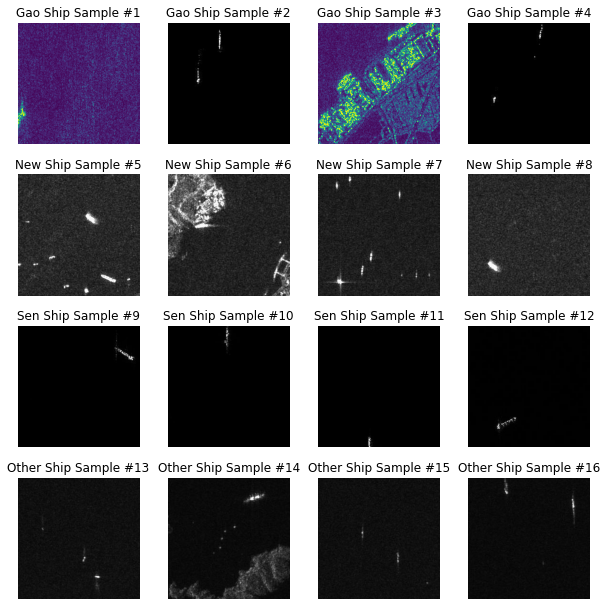

In [ ]:
import matplotlib.pyplot as plt 
from PIL import Image
 
def plot():
    
    # create figure
    fig = plt.figure(figsize=(20, 20))
    # setting values to rows and column variables
    rows = 4
    columns = 4

    for i,k in enumerate(range(1,17)):
        if k <= 4:
            # Adds a subplot at the 1st position
            fig.add_subplot(rows, columns, k)
            plt.title('Gao Ship Sample #'+ str(k))
            # showing image
            img = Image.open(gao_files[i])
            plt.imshow(img)
            plt.axis("off")
        elif k > 4 and k < 9: 
            # Adds a subplot at the 1st position
            fig.add_subplot(rows, columns, k)
            plt.title('New Ship Sample #'+ str(k))
            # showing image
            img = Image.open(new_files[i])
            plt.imshow(img)
            plt.axis("off")
        elif k >= 9 and k < 13: 
            # Adds a subplot at the 1st position
            fig.add_subplot(rows, columns, k)
            plt.title('Sen Ship Sample #'+ str(k))
            # showing image
            img = Image.open(sen_files[i])
            plt.imshow(img)
            plt.axis("off")
        elif k >= 13 and k < 17: 
            # Adds a subplot at the 1st position
            fig.add_subplot(rows, columns, k)
            plt.title('Other Ship Sample #'+ str(k))
            # showing image
            img = Image.open(ship_files[i])
            plt.imshow(img)
            plt.axis("off")                       
            
    plt.subplots_adjust(bottom=0.3, top=0.7, hspace=0.25, right = 1, left = 0.6)

    

#Implementation of the function 

plot()

A quick look at pixel intensity of images.

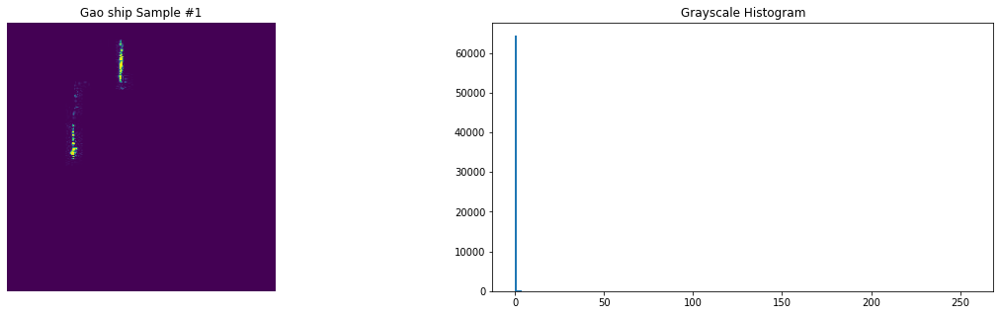

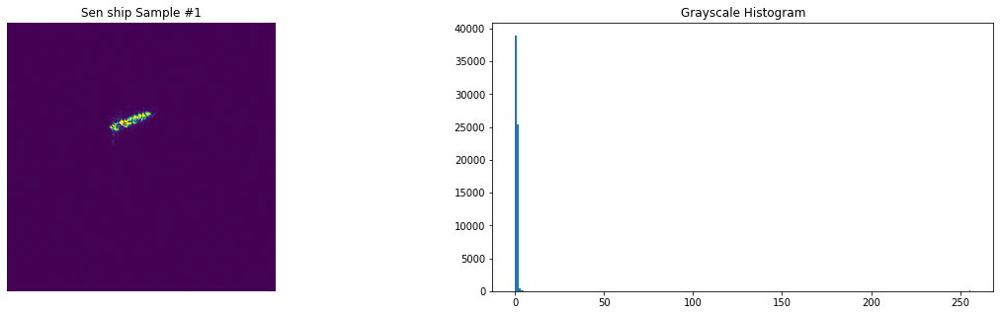

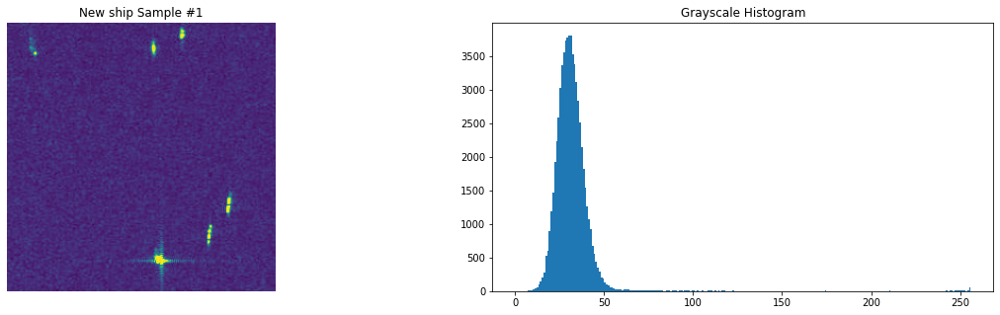

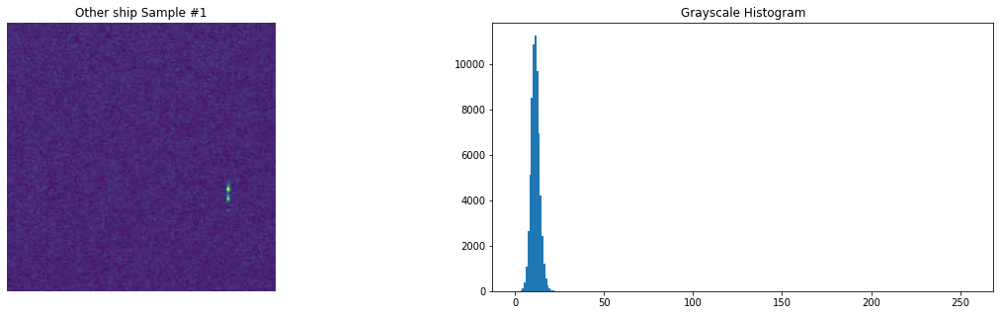

In [ ]:
import cv2                
import matplotlib
import matplotlib.pyplot as plt                        
%matplotlib inline 
from PIL import Image

def plotHistogram(ship, type):

    # create figure
    fig = plt.figure(figsize=(20, 5))
    # setting values to rows and column variables
    rows = 1
    columns = 2

    k = 1
    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, k)
    plt.title(type + ' ship Sample #' + str(k))
    # showing image
    plt.axis("off")


    # load color (BGR) image
    img = cv2.imread(ship)
    # convert BGR image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
    plt.imshow(gray)
    #plt.show()

    k = 2
    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, k)
    img = cv2.imread(ship, 0)
    plt.hist(img.ravel(), 256, (0, 256))
    plt.title("Grayscale Histogram")
    #,255)
    plt.show()

for i in range (1,2):
    plotHistogram(gao_files[i], "Gao")
    plotHistogram(sen_files[i], "Sen") 
    plotHistogram(new_files[i], "New")
    plotHistogram(ship_files[i], "Other")          

##**Step 0-II: Pre-process Data via Ship Detection/Segmentation**

###**Step 3-1: The Overview**

In [108]:
sample_data_file_name = '/content/drive/MyDrive/ship_detection/Sen_ship_hh_020161127030806.jpg'#'/content/drive/MyDrive/ship_detection/1056417_2017-03-08_RE3_3A_Visual_clip.tiff'

(256, 256, 3)


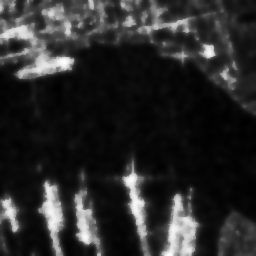

In [109]:
import skimage.io
from IPython.display import Image
from skimage.restoration import (denoise_tv_chambolle, denoise_bilateral,
                                 denoise_wavelet, estimate_sigma)
# Read image into scimage package
img = skimage.io.imread(sample_data_file_name[:-4]+'.jpg')
img = 256*denoise_tv_chambolle(img, weight=0.5)

skimage.io.imsave('/content/drive/MyDrive/ship_detection/output/original.png', img)
print(img.shape)
# Display original image
display(Image(filename='/content/drive/MyDrive/ship_detection/output/original.png'))

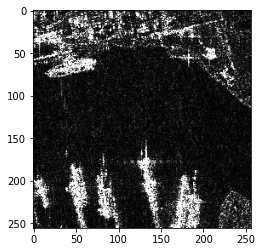

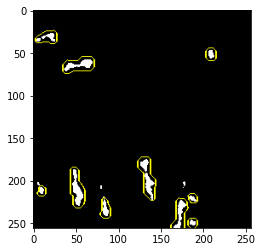

Ship 1: 


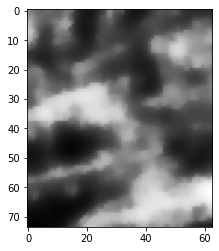

Ship 2: 


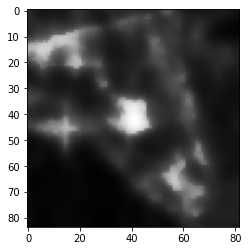

Ship 3: 


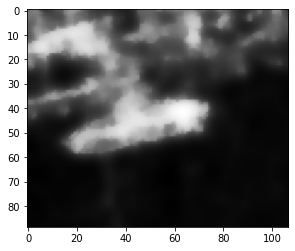

Ship 4: 


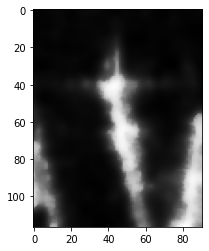

Ship 5: 


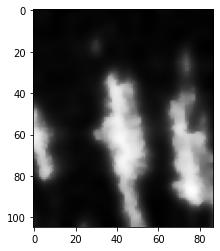

Ship 6: 


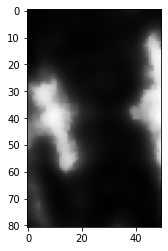

Ship 7: 


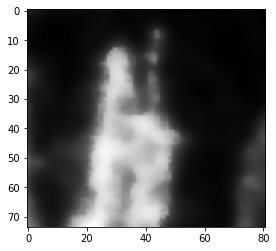

Ship 8: 


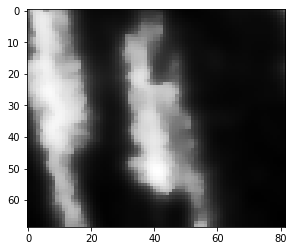

Ship 9: 


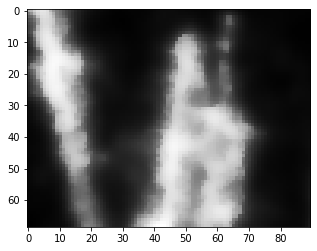

Ship 10: 


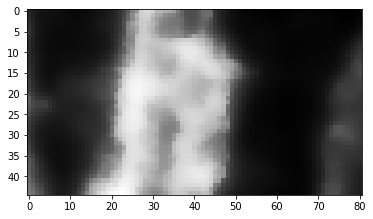

In [110]:
import json
import gdal
import osr
import numpy
from skimage.segmentation import felzenszwalb
from skimage.segmentation import mark_boundaries
from skimage.measure import regionprops
import matplotlib.pyplot as plt
import os
import glob

files = glob.glob('/content/drive/MyDrive/ship_detection/output/*')
for f in files:
    os.remove(f)

# Open image with gdal
ds = gdal.Open(sample_data_file_name)
xoff, a, b, yoff, d, e = ds.GetGeoTransform()

# Get projection information from source image
ds_proj = ds.GetProjectionRef()
ds_srs = osr.SpatialReference(ds_proj)

# Get the source image's geographic coordinate system (the 'GEOGCS' node of ds_srs)
geogcs = ds_srs.CloneGeogCS()

# Set up a transformation between projected coordinates (x, y) & geographic coordinates (lat, lon)
transform = osr.CoordinateTransformation(ds_srs, geogcs)

# Convert multi-channel image it into red, green and blueb[, alpha] channels 

if len(img.shape) == 3:
  red, green, blue = numpy.rollaxis(numpy.array(img), axis=-1)
  alpha = red
else:
  red = numpy.rollaxis(numpy.array(img), axis=-1)
  alpha = red

# Mask: threshold + stops canny detecting image boundary edges
mask = red > 200

# Create mask for edge detection
skimage.io.imsave('/content/drive/MyDrive/ship_detection/output/mask.png', mask * 255)

# Use Felzenszwalb algo to find segements
segments_fz = felzenszwalb(numpy.dstack((mask, mask, mask)),
                               scale=5000,
                               sigma=3.1,
                               min_size=25) 

# Build labeled mask to show where ships were dectected
segmented_img = mark_boundaries(mask, segments_fz)
skimage.io.imsave('/content/drive/MyDrive/ship_detection/output/mask_labeled.png', segmented_img)


# Preserve the bounding box for display of copped immages
bounding_boxes = []


# Count ships and save image of each boat clipped from masked image
for idx, ship in enumerate(regionprops(segments_fz)):
    # If area matches that of a stanard ship, count it
    if (ship.area >= 10 and ship.area <= 1000):
        
        # Create ship thumbnail
        x, y = (int(numpy.average([ship.bbox[0],
                                ship.bbox[2]])),
                                int(numpy.average([ship.bbox[1],
                                ship.bbox[3]])))
        sx, ex = max(ship.bbox[0]-35,0), min(ship.bbox[2]+35,img.shape[0] - 1)#max(x - 15, 0), min(x + 15, img.shape[0] - 1)
        sy, ey = max(ship.bbox[1]-35,0), min(ship.bbox[3]+35,img.shape[1] - 1)#max(y - 15, 0), min(y + 15, img.shape[1] - 1)
        img_ship = img[sx:ex, sy:ey]
        bounding_boxes.append({
            'x1': ship.bbox[0],
            'x2': ship.bbox[2],
            'y1': ship.bbox[1],
            'y2': ship.bbox[3]})
        skimage.io.imsave('/content/drive/MyDrive/ship_detection/output/ship-%s.png' % str(idx), img_ship)

        # Get global coordinates from pixel x, y coords
        projected_x = float(a * y + b * x + xoff)
        projected_y = float(d * y + e * x + yoff)

        

# Display results
# Display the image
from PIL import Image
plt.imshow(Image.open(sample_data_file_name))
plt.show()

# Display labled mask where we detected ships
plt.imshow(Image.open('/content/drive/MyDrive/ship_detection/output/mask_labeled.png'))
plt.show()
# Display each individual ship cropped out of the original image
import glob
number = 1
for filepath in glob.iglob('/content/drive/MyDrive/ship_detection/output/ship*.png'):
    print('Ship {}: '. format(number))
    number += 1
    plt.imshow(Image.open(filepath))
    plt.show()    

Remove previous files from train, validation, and test folders 

In [3]:
def clearDirectories():
  import glob

  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/train/001.Gao/*')
  for f in files:
      os.remove(f)
  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/valid/001.Gao/*')
  for f in files:
      os.remove(f)
  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/test/001.Gao/*')
  for f in files:
      os.remove(f)
  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/train/002.Newship/*')
  for f in files:
      os.remove(f)
  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/valid/002.Newship/*')
  for f in files:
      os.remove(f)
  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/test/002.Newship/*')
  for f in files:
      os.remove(f)
  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/train/003.Sen/*')
  for f in files:
      os.remove(f)
  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/valid/003.Sen/*')
  for f in files:
      os.remove(f)
  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/test/003.Sen/*')
  for f in files:
      os.remove(f)
  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/train/004.Ship/*')
  for f in files:
      os.remove(f)
  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/valid/004.Ship/*')
  for f in files:
      os.remove(f)
  files = glob.glob('/content/drive/MyDrive/ship_detection_segmented/test/004.Ship/*')
  for f in files:
      os.remove(f)

###**Step 3-2: Prepare Detected Images for Classification**

In [1]:
import skimage.io
from IPython.display import Image

import json
import gdal
import osr
import numpy
from skimage.segmentation import felzenszwalb
from skimage.segmentation import mark_boundaries
from skimage.measure import regionprops
import matplotlib.pyplot as plt
import os
import glob

from skimage.restoration import (denoise_tv_chambolle, denoise_bilateral,
                                 denoise_wavelet, estimate_sigma)


def prepareCroppedImages(source_folder, sample_data_file_name, 
                         file_format, output_folder, ship_type,
                         min_area, max_area, min_mask_value, denoising_weight):


  # Read and denoise image into scimage package
  img = skimage.io.imread(source_folder+'/'+sample_data_file_name+file_format)
  img = 255*denoise_tv_chambolle(img, weight=denoising_weight)


  skimage.io.imsave(output_folder+'/original.png', img)

  # Open image with gdal
  ds = gdal.Open(source_folder+'/'+sample_data_file_name+file_format)
  xoff, a, b, yoff, d, e = ds.GetGeoTransform()

  # Get projection information from source image
  ds_proj = ds.GetProjectionRef()
  ds_srs = osr.SpatialReference(ds_proj)

  # Get the source image's geographic coordinate system (the 'GEOGCS' node of ds_srs)
  geogcs = ds_srs.CloneGeogCS()

  # Set up a transformation between projected coordinates (x, y) & geographic coordinates (lat, lon)
  transform = osr.CoordinateTransformation(ds_srs, geogcs)

  # Convert multi-channel image it into red, green and blueb[, alpha] channels 

  if len(img.shape) == 3:
    red, green, blue = numpy.rollaxis(numpy.array(img), axis=-1)
    alpha = red
  else:
    red = numpy.rollaxis(numpy.array(img), axis=-1)
    alpha = red
  # Mask: threshold + stops canny detecting image boundary edges
  mask = red > min_mask_value

  # Create mask for edge detection
  skimage.io.imsave(output_folder+'/mask.png', mask * 255)

  # Use Felzenszwalb algo to find segements
  segments_fz = felzenszwalb(numpy.dstack((mask, mask, mask)),
                                scale=5000,
                                sigma=3.1,
                                min_size=25) 

  # Build labeled mask to show where ships were dectected
  segmented_img = mark_boundaries(mask, segments_fz)
  skimage.io.imsave(output_folder+'/mask_labeled.png', segmented_img)


  # Preserve the bounding box for display of copped immages
  bounding_boxes = []


  # Count ships and save image of each boat clipped from masked image
  for idx, ship in enumerate(regionprops(segments_fz)):
      # If area matches that of a stanard ship, count it
      if (ship.area >= min_area and ship.area <= max_area):
          
          
          # Create ship thumbnail
          x, y = (int(numpy.average([ship.bbox[0],
                                  ship.bbox[2]])),
                                  int(numpy.average([ship.bbox[1],
                                  ship.bbox[3]])))
          sx, ex = max(ship.bbox[0]-35,0), min(ship.bbox[2]+35,img.shape[0] - 1)#max(x - 15, 0), min(x + 15, img.shape[0] - 1)
          sy, ey = max(ship.bbox[1]-35,0), min(ship.bbox[3]+35,img.shape[1] - 1)#max(y - 15, 0), min(y + 15, img.shape[1] - 1)
          img_ship = img[sx:ex, sy:ey]
          bounding_boxes.append({
              'x1': ship.bbox[0],
              'x2': ship.bbox[2],
              'y1': ship.bbox[1],
              'y2': ship.bbox[3]})
          skimage.io.imsave(output_folder+'/'+sample_data_file_name+'_ship-%s.png' % str(idx), img_ship)

          # Get global coordinates from pixel x, y coords
          projected_x = float(a * y + b * x + xoff)
          projected_y = float(d * y + e * x + yoff)
  return bounding_boxes          

In [4]:
import warnings
warnings.filterwarnings("ignore")



source_folder = ['/content/drive/MyDrive/ship_dataset/train/001.Gao',
                 '/content/drive/MyDrive/ship_dataset/valid/001.Gao',
                 '/content/drive/MyDrive/ship_dataset/test/001.Gao',
                 '/content/drive/MyDrive/ship_dataset/train/002.Newship',
                 '/content/drive/MyDrive/ship_dataset/valid/002.Newship',
                 '/content/drive/MyDrive/ship_dataset/test/002.Newship',
                 '/content/drive/MyDrive/ship_dataset/train/003.Sen',
                 '/content/drive/MyDrive/ship_dataset/valid/003.Sen',
                 '/content/drive/MyDrive/ship_dataset/test/003.Sen',
                 '/content/drive/MyDrive/ship_dataset/train/004.Ship',
                 '/content/drive/MyDrive/ship_dataset/valid/004.Ship',
                 '/content/drive/MyDrive/ship_dataset/test/004.Ship']
output_folder = ['/content/drive/MyDrive/ship_detection_segmented/train/001.Gao',
                 '/content/drive/MyDrive/ship_detection_segmented/valid/001.Gao',
                 '/content/drive/MyDrive/ship_detection_segmented/test/001.Gao',
                 '/content/drive/MyDrive/ship_detection_segmented/train/002.Newship',
                 '/content/drive/MyDrive/ship_detection_segmented/valid/002.Newship',
                 '/content/drive/MyDrive/ship_detection_segmented/test/002.Newship',
                 '/content/drive/MyDrive/ship_detection_segmented/train/003.Sen',
                 '/content/drive/MyDrive/ship_detection_segmented/valid/003.Sen',
                 '/content/drive/MyDrive/ship_detection_segmented/test/003.Sen',
                 '/content/drive/MyDrive/ship_detection_segmented/train/004.Ship',
                 '/content/drive/MyDrive/ship_detection_segmented/valid/004.Ship',
                 '/content/drive/MyDrive/ship_detection_segmented/test/004.Ship']

min_area = [800.0,
            800.0,
            800.0,
            800.0,
            800.0,
            800.0,
            800.0,
            800.0,
            800.0,
            500.0,
            500.0,
            500.0]

max_area = [5000.0,
            5000.0,
            5000.0,
            5000.0,
            5000.0,
            5000.0,
            5000.0,
            5000.0,
            5000.0,
            1000.0,
            1000.0,
            1000.0]

min_mask_value = [100.0,
                  100.0,
                  100.0,
                  100.0,
                  100.0,
                  100.0,
                  100.0,
                  100.0,
                  100.0,
                  100.0,
                  100.0,
                  60.0]

denoising_weight = [0.1,
                    0.1,
                    0.1,
                    0.1,
                    0.1,
                    0.1,
                    0.1,
                    0.1,
                    0.1,
                    0.001,
                    0.001,
                    0.001]
# Clear existing files in destination folders
# clearDirectories()

sample_data_file_name = ''
file_format = '.jpg'
MAX_COUNT = 1000
for i in range (0,len(output_folder)):
  counter = 0
  print('Processing Folder: ' + source_folder[i] + '...')
  files = glob.glob(source_folder[i]+'/*')
  for path in files:
      sample_data_file_name = os.path.basename(path)
      counter += 1
      if counter <= MAX_COUNT:
        print("File Number: ", counter)
        try:
          prepareCroppedImages(source_folder = source_folder[i], 
                                  sample_data_file_name = sample_data_file_name[:-4],
                                  file_format = '.jpg', 
                                  output_folder = output_folder[i], 
                                  ship_type = i,
                                  min_area = min_area[i],
                                  max_area = max_area[i],
                                  min_mask_value = min_mask_value[i],
                                  denoising_weight = denoising_weight[i])
        except:
          continue
      

Processing Folder: /content/drive/MyDrive/ship_dataset/train/001.Gao...


File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


File Number:  38


File Number:  39


File Number:  40


File Number:  41


File Number:  42


File Number:  43


File Number:  44


File Number:  45


File Number:  46


File Number:  47


File Number:  48


File Number:  49


File Number:  50


File Number:  51


File Number:  52


File Number:  53


File Number:  54


File Number:  55


File Number:  56


File Number:  57


File Number:  58


File Number:  59


File Number:  60


File Number:  61


File Number:  62


File Number:  63


File Number:  64


File Number:  65


File Number:  66


File Number:  67


File Number:  68


File Number:  69


File Number:  70


File Number:  71


File Number:  72


File Number:  73


File Number:  74


File Number:  75


File Number:  76


File Number:  77


File Number:  78


File Number:  79


File Number:  80


File Number:  81


File Number:  82


File Number:  83


File Number:  84


File Number:  85


File Number:  86


File Number:  87


File Number:  88


File Number:  89


File Number:  90


File Number:  91


File Number:  92


File Number:  93


File Number:  94


File Number:  95


File Number:  96


File Number:  97


File Number:  98


File Number:  99


File Number:  100


File Number:  101


File Number:  102


File Number:  103


File Number:  104


File Number:  105


File Number:  106


File Number:  107


File Number:  108


File Number:  109


File Number:  110


File Number:  111


File Number:  112


File Number:  113


File Number:  114


File Number:  115


File Number:  116


File Number:  117


File Number:  118


File Number:  119


File Number:  120


File Number:  121


File Number:  122


File Number:  123


File Number:  124


File Number:  125


File Number:  126


File Number:  127


File Number:  128


File Number:  129


File Number:  130


File Number:  131


File Number:  132


File Number:  133


File Number:  134


File Number:  135


File Number:  136


File Number:  137


File Number:  138


File Number:  139


File Number:  140


File Number:  141


File Number:  142


File Number:  143


File Number:  144


File Number:  145


File Number:  146


File Number:  147


File Number:  148


File Number:  149


File Number:  150


File Number:  151


File Number:  152


File Number:  153


File Number:  154


File Number:  155


File Number:  156


File Number:  157


File Number:  158


File Number:  159


File Number:  160


File Number:  161


File Number:  162


File Number:  163


File Number:  164


File Number:  165


File Number:  166


File Number:  167


File Number:  168


File Number:  169


File Number:  170


File Number:  171


File Number:  172


File Number:  173


File Number:  174


File Number:  175


File Number:  176


File Number:  177


File Number:  178


File Number:  179


File Number:  180


File Number:  181


File Number:  182


File Number:  183


File Number:  184


File Number:  185


File Number:  186


File Number:  187


File Number:  188


File Number:  189


File Number:  190


File Number:  191


File Number:  192


File Number:  193


File Number:  194


File Number:  195


File Number:  196


File Number:  197


File Number:  198


File Number:  199


File Number:  200


File Number:  201


File Number:  202


File Number:  203


File Number:  204


File Number:  205


File Number:  206


File Number:  207


File Number:  208


File Number:  209


File Number:  210


File Number:  211


File Number:  212


File Number:  213


File Number:  214


File Number:  215


File Number:  216


File Number:  217


File Number:  218


File Number:  219


File Number:  220


File Number:  221


File Number:  222


File Number:  223


File Number:  224


File Number:  225


File Number:  226


File Number:  227


File Number:  228


File Number:  229


File Number:  230


File Number:  231


File Number:  232


File Number:  233


File Number:  234


File Number:  235


File Number:  236


File Number:  237


File Number:  238


File Number:  239


File Number:  240


File Number:  241


File Number:  242


File Number:  243


File Number:  244


File Number:  245


File Number:  246


File Number:  247


File Number:  248


File Number:  249


File Number:  250


File Number:  251


File Number:  252


File Number:  253


File Number:  254


File Number:  255


File Number:  256


File Number:  257


File Number:  258


File Number:  259


File Number:  260


File Number:  261


File Number:  262


File Number:  263


File Number:  264


File Number:  265


File Number:  266


File Number:  267


File Number:  268


File Number:  269


File Number:  270


File Number:  271


File Number:  272


File Number:  273


File Number:  274


File Number:  275


File Number:  276


File Number:  277


File Number:  278


File Number:  279


File Number:  280


File Number:  281


File Number:  282


File Number:  283


File Number:  284


File Number:  285


File Number:  286


File Number:  287


File Number:  288


File Number:  289


File Number:  290


File Number:  291


File Number:  292


File Number:  293


File Number:  294


File Number:  295


File Number:  296


File Number:  297


File Number:  298


File Number:  299


File Number:  300


File Number:  301


File Number:  302


File Number:  303


File Number:  304


File Number:  305


File Number:  306


File Number:  307


File Number:  308


File Number:  309


File Number:  310


File Number:  311


File Number:  312


File Number:  313


File Number:  314


File Number:  315


File Number:  316


File Number:  317


File Number:  318


File Number:  319


File Number:  320


File Number:  321


File Number:  322


File Number:  323


File Number:  324


File Number:  325


File Number:  326


File Number:  327


File Number:  328


File Number:  329


File Number:  330


File Number:  331


File Number:  332


File Number:  333


File Number:  334


File Number:  335


File Number:  336


File Number:  337


File Number:  338


File Number:  339


File Number:  340


File Number:  341


File Number:  342


File Number:  343


File Number:  344


File Number:  345


File Number:  346


File Number:  347


File Number:  348


File Number:  349


File Number:  350


File Number:  351


File Number:  352


File Number:  353


File Number:  354


File Number:  355


File Number:  356


File Number:  357


File Number:  358


File Number:  359


File Number:  360


File Number:  361


File Number:  362


File Number:  363


File Number:  364


File Number:  365


File Number:  366


File Number:  367


File Number:  368


File Number:  369


File Number:  370


File Number:  371


File Number:  372


File Number:  373


File Number:  374


File Number:  375


File Number:  376


File Number:  377


File Number:  378


File Number:  379


File Number:  380


File Number:  381


File Number:  382


File Number:  383


File Number:  384


File Number:  385


File Number:  386


File Number:  387


File Number:  388


File Number:  389


File Number:  390


File Number:  391


File Number:  392


File Number:  393


File Number:  394


File Number:  395


File Number:  396


File Number:  397


File Number:  398


File Number:  399


File Number:  400


File Number:  401


File Number:  402


File Number:  403


File Number:  404


File Number:  405


File Number:  406


File Number:  407


File Number:  408


File Number:  409


File Number:  410


File Number:  411


File Number:  412


File Number:  413


File Number:  414


File Number:  415


File Number:  416


File Number:  417


File Number:  418


File Number:  419


File Number:  420


File Number:  421


File Number:  422


File Number:  423


File Number:  424


File Number:  425


File Number:  426


File Number:  427


File Number:  428


File Number:  429


File Number:  430


File Number:  431


File Number:  432


File Number:  433


File Number:  434


File Number:  435


File Number:  436


File Number:  437


File Number:  438


File Number:  439


File Number:  440


File Number:  441


File Number:  442


File Number:  443


File Number:  444


File Number:  445


File Number:  446


File Number:  447


File Number:  448


File Number:  449


File Number:  450


File Number:  451


File Number:  452


File Number:  453


File Number:  454


File Number:  455


File Number:  456


File Number:  457


File Number:  458


File Number:  459


File Number:  460


File Number:  461


File Number:  462


File Number:  463


File Number:  464


File Number:  465


File Number:  466


File Number:  467


File Number:  468


File Number:  469


File Number:  470


File Number:  471


File Number:  472


File Number:  473


File Number:  474


File Number:  475


File Number:  476


File Number:  477


File Number:  478


File Number:  479


File Number:  480


File Number:  481


File Number:  482


File Number:  483


File Number:  484


File Number:  485


File Number:  486


File Number:  487


File Number:  488


File Number:  489


File Number:  490


File Number:  491


File Number:  492


File Number:  493


File Number:  494


File Number:  495


File Number:  496


File Number:  497


File Number:  498


File Number:  499


File Number:  500


File Number:  501


File Number:  502


File Number:  503


File Number:  504


File Number:  505


File Number:  506


File Number:  507


File Number:  508


File Number:  509


File Number:  510


File Number:  511


File Number:  512


File Number:  513


File Number:  514


File Number:  515


File Number:  516


File Number:  517


File Number:  518


File Number:  519


File Number:  520


File Number:  521


File Number:  522


File Number:  523


File Number:  524


File Number:  525


File Number:  526


File Number:  527


File Number:  528


File Number:  529


File Number:  530


File Number:  531


File Number:  532


File Number:  533


File Number:  534


File Number:  535


File Number:  536


File Number:  537


File Number:  538


File Number:  539


File Number:  540


File Number:  541


File Number:  542


File Number:  543


File Number:  544


File Number:  545


File Number:  546


File Number:  547


File Number:  548


File Number:  549


File Number:  550


File Number:  551


File Number:  552


File Number:  553


File Number:  554


File Number:  555


File Number:  556


File Number:  557


File Number:  558


File Number:  559


File Number:  560


File Number:  561


File Number:  562


File Number:  563


File Number:  564


File Number:  565


File Number:  566


File Number:  567


File Number:  568


File Number:  569


File Number:  570


File Number:  571


File Number:  572


File Number:  573


File Number:  574


File Number:  575


File Number:  576


File Number:  577


File Number:  578


File Number:  579


File Number:  580


File Number:  581


File Number:  582


File Number:  583


File Number:  584


File Number:  585


File Number:  586


File Number:  587


File Number:  588


File Number:  589


File Number:  590


File Number:  591


File Number:  592


File Number:  593


File Number:  594


File Number:  595


File Number:  596


File Number:  597


File Number:  598


File Number:  599


File Number:  600


File Number:  601


File Number:  602


File Number:  603


File Number:  604


File Number:  605


File Number:  606


File Number:  607


File Number:  608


File Number:  609


File Number:  610


File Number:  611


File Number:  612


File Number:  613


File Number:  614


File Number:  615


File Number:  616


File Number:  617


File Number:  618


File Number:  619


File Number:  620


File Number:  621


File Number:  622


File Number:  623


File Number:  624


File Number:  625


File Number:  626


File Number:  627


File Number:  628


File Number:  629


File Number:  630


File Number:  631


File Number:  632


File Number:  633


File Number:  634


File Number:  635


File Number:  636


File Number:  637


File Number:  638


File Number:  639


File Number:  640


File Number:  641


File Number:  642


File Number:  643


File Number:  644


File Number:  645


File Number:  646


File Number:  647


File Number:  648


File Number:  649


File Number:  650


File Number:  651


File Number:  652


File Number:  653


File Number:  654


File Number:  655


File Number:  656


File Number:  657


File Number:  658


File Number:  659


File Number:  660


File Number:  661


File Number:  662


File Number:  663


File Number:  664


File Number:  665


File Number:  666


File Number:  667


File Number:  668


File Number:  669


File Number:  670


File Number:  671


File Number:  672


File Number:  673


File Number:  674


File Number:  675


File Number:  676


File Number:  677


File Number:  678


File Number:  679


File Number:  680


File Number:  681


File Number:  682


File Number:  683


File Number:  684


File Number:  685


File Number:  686


File Number:  687


File Number:  688


File Number:  689


File Number:  690


File Number:  691


File Number:  692


File Number:  693


File Number:  694


File Number:  695


File Number:  696


File Number:  697


File Number:  698


File Number:  699


File Number:  700


File Number:  701


File Number:  702


File Number:  703


File Number:  704


File Number:  705


File Number:  706


File Number:  707


File Number:  708


File Number:  709


File Number:  710


File Number:  711


File Number:  712


File Number:  713


File Number:  714


File Number:  715


File Number:  716


File Number:  717


File Number:  718


File Number:  719


File Number:  720


File Number:  721


File Number:  722


File Number:  723


File Number:  724


File Number:  725


File Number:  726


File Number:  727


File Number:  728


File Number:  729


File Number:  730


File Number:  731


File Number:  732


File Number:  733


File Number:  734


File Number:  735


File Number:  736


File Number:  737


File Number:  738


File Number:  739


File Number:  740


File Number:  741


File Number:  742


File Number:  743


File Number:  744


File Number:  745


File Number:  746


File Number:  747


File Number:  748


File Number:  749


File Number:  750


File Number:  751


File Number:  752


File Number:  753


File Number:  754


File Number:  755


File Number:  756


File Number:  757


File Number:  758


File Number:  759


File Number:  760


File Number:  761


File Number:  762


File Number:  763


File Number:  764


File Number:  765


File Number:  766


File Number:  767


File Number:  768


File Number:  769


File Number:  770


File Number:  771


File Number:  772


File Number:  773


File Number:  774


File Number:  775


File Number:  776


File Number:  777


File Number:  778


File Number:  779


File Number:  780


File Number:  781


File Number:  782


File Number:  783


File Number:  784


File Number:  785


File Number:  786


File Number:  787


File Number:  788


File Number:  789


File Number:  790


File Number:  791


File Number:  792


File Number:  793


File Number:  794


File Number:  795


File Number:  796


File Number:  797


File Number:  798


File Number:  799


File Number:  800


File Number:  801


File Number:  802


File Number:  803


File Number:  804


File Number:  805


File Number:  806


File Number:  807


File Number:  808


File Number:  809


File Number:  810


File Number:  811


File Number:  812


File Number:  813


File Number:  814


File Number:  815


File Number:  816


File Number:  817


File Number:  818


File Number:  819


File Number:  820


File Number:  821


File Number:  822


File Number:  823


File Number:  824


File Number:  825


File Number:  826


File Number:  827


File Number:  828


File Number:  829


File Number:  830


File Number:  831


File Number:  832


File Number:  833


File Number:  834


File Number:  835


File Number:  836


File Number:  837


File Number:  838


File Number:  839


File Number:  840


File Number:  841


File Number:  842


File Number:  843


File Number:  844


File Number:  845


File Number:  846


File Number:  847


File Number:  848


File Number:  849


File Number:  850


File Number:  851


File Number:  852


File Number:  853


File Number:  854


File Number:  855


File Number:  856


File Number:  857


File Number:  858


File Number:  859


File Number:  860


File Number:  861


File Number:  862


File Number:  863


File Number:  864


File Number:  865


File Number:  866


File Number:  867


File Number:  868


File Number:  869


File Number:  870


File Number:  871


File Number:  872


File Number:  873


File Number:  874


File Number:  875


File Number:  876


File Number:  877


File Number:  878


File Number:  879


File Number:  880


File Number:  881


File Number:  882


File Number:  883


File Number:  884


File Number:  885


File Number:  886


File Number:  887


File Number:  888


File Number:  889


File Number:  890


File Number:  891


File Number:  892


File Number:  893


File Number:  894


File Number:  895


File Number:  896


File Number:  897


File Number:  898


File Number:  899


File Number:  900


File Number:  901


File Number:  902


File Number:  903


File Number:  904


File Number:  905


File Number:  906


File Number:  907


File Number:  908


File Number:  909


File Number:  910


File Number:  911


File Number:  912


File Number:  913


File Number:  914


File Number:  915


File Number:  916


File Number:  917


File Number:  918


File Number:  919


File Number:  920


File Number:  921


File Number:  922


File Number:  923


File Number:  924


File Number:  925


File Number:  926


File Number:  927


File Number:  928


File Number:  929


File Number:  930


File Number:  931


File Number:  932


File Number:  933


File Number:  934


File Number:  935


File Number:  936


File Number:  937


File Number:  938


File Number:  939


File Number:  940


File Number:  941


File Number:  942


File Number:  943


File Number:  944


File Number:  945


File Number:  946


File Number:  947


File Number:  948


File Number:  949


File Number:  950


File Number:  951


File Number:  952


File Number:  953


File Number:  954


File Number:  955


File Number:  956


File Number:  957


File Number:  958


File Number:  959


File Number:  960


File Number:  961


File Number:  962


File Number:  963


File Number:  964


File Number:  965


File Number:  966


File Number:  967


File Number:  968


File Number:  969


File Number:  970


File Number:  971


File Number:  972


File Number:  973


File Number:  974


File Number:  975


File Number:  976


File Number:  977


File Number:  978


File Number:  979


File Number:  980


File Number:  981


File Number:  982


File Number:  983


File Number:  984


File Number:  985


File Number:  986


File Number:  987


File Number:  988


File Number:  989


File Number:  990


File Number:  991


File Number:  992


File Number:  993


File Number:  994


File Number:  995


File Number:  996


File Number:  997


File Number:  998


File Number:  999


File Number:  1000


Processing Folder: /content/drive/MyDrive/ship_dataset/valid/001.Gao...
File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


File Number:  38


File Number:  39


File Number:  40


File Number:  41


File Number:  42


File Number:  43


File Number:  44


File Number:  45


File Number:  46


File Number:  47


File Number:  48


File Number:  49


File Number:  50


File Number:  51


File Number:  52


File Number:  53


File Number:  54


File Number:  55


File Number:  56


File Number:  57


File Number:  58


File Number:  59


File Number:  60


File Number:  61


File Number:  62


File Number:  63


File Number:  64


File Number:  65


File Number:  66


File Number:  67


File Number:  68


File Number:  69


File Number:  70


File Number:  71


File Number:  72


File Number:  73


File Number:  74


File Number:  75


File Number:  76


File Number:  77


File Number:  78


File Number:  79


File Number:  80


File Number:  81


File Number:  82


File Number:  83


File Number:  84


File Number:  85


File Number:  86


File Number:  87


File Number:  88


File Number:  89


File Number:  90


File Number:  91


File Number:  92


File Number:  93


File Number:  94


File Number:  95


File Number:  96


File Number:  97


File Number:  98


File Number:  99


File Number:  100


File Number:  101


File Number:  102


File Number:  103


File Number:  104


File Number:  105


File Number:  106


File Number:  107


File Number:  108


File Number:  109


File Number:  110


File Number:  111


File Number:  112


File Number:  113


File Number:  114


File Number:  115


File Number:  116


File Number:  117


File Number:  118


File Number:  119


File Number:  120


File Number:  121


File Number:  122


File Number:  123


File Number:  124


File Number:  125


File Number:  126


File Number:  127


File Number:  128


File Number:  129


File Number:  130


File Number:  131


File Number:  132


File Number:  133


File Number:  134


File Number:  135


File Number:  136


File Number:  137


File Number:  138


File Number:  139


File Number:  140


File Number:  141


File Number:  142


File Number:  143


File Number:  144


File Number:  145


File Number:  146


File Number:  147


File Number:  148


File Number:  149


File Number:  150


File Number:  151


File Number:  152


File Number:  153


File Number:  154


File Number:  155


File Number:  156


File Number:  157


File Number:  158


File Number:  159


File Number:  160


File Number:  161


File Number:  162


File Number:  163


File Number:  164


File Number:  165


File Number:  166


File Number:  167


File Number:  168


File Number:  169


File Number:  170


File Number:  171


File Number:  172


File Number:  173


File Number:  174


File Number:  175


File Number:  176


File Number:  177


File Number:  178


File Number:  179


File Number:  180


File Number:  181


File Number:  182


File Number:  183


File Number:  184


File Number:  185


File Number:  186


File Number:  187


File Number:  188


File Number:  189


File Number:  190


File Number:  191


File Number:  192


File Number:  193


File Number:  194


File Number:  195


File Number:  196


File Number:  197


File Number:  198


File Number:  199


File Number:  200


File Number:  201


File Number:  202


File Number:  203


File Number:  204


File Number:  205


File Number:  206


File Number:  207


File Number:  208


File Number:  209


File Number:  210


File Number:  211


File Number:  212


File Number:  213


File Number:  214


File Number:  215


File Number:  216


File Number:  217


File Number:  218


File Number:  219


File Number:  220


File Number:  221


File Number:  222


File Number:  223


File Number:  224


File Number:  225


File Number:  226


File Number:  227


File Number:  228


File Number:  229


File Number:  230


File Number:  231


File Number:  232


File Number:  233


File Number:  234


File Number:  235


File Number:  236


File Number:  237


File Number:  238


File Number:  239


File Number:  240


File Number:  241


File Number:  242


File Number:  243


File Number:  244


File Number:  245


File Number:  246


File Number:  247


File Number:  248


File Number:  249


File Number:  250


File Number:  251


File Number:  252


File Number:  253


File Number:  254


File Number:  255


File Number:  256


File Number:  257


File Number:  258


File Number:  259


File Number:  260


File Number:  261


File Number:  262


File Number:  263


File Number:  264


File Number:  265


File Number:  266


File Number:  267


File Number:  268


File Number:  269


File Number:  270


File Number:  271


File Number:  272


File Number:  273


File Number:  274


File Number:  275


File Number:  276


File Number:  277


File Number:  278


File Number:  279


File Number:  280


File Number:  281


File Number:  282


File Number:  283


File Number:  284


File Number:  285


File Number:  286


File Number:  287


File Number:  288


File Number:  289


File Number:  290


File Number:  291


File Number:  292


File Number:  293


File Number:  294


File Number:  295


File Number:  296


File Number:  297


File Number:  298


File Number:  299


File Number:  300


File Number:  301


File Number:  302


File Number:  303


File Number:  304


File Number:  305


File Number:  306


File Number:  307


File Number:  308


File Number:  309


File Number:  310


File Number:  311


File Number:  312


File Number:  313


File Number:  314


File Number:  315


File Number:  316


File Number:  317


File Number:  318


File Number:  319


File Number:  320


File Number:  321


File Number:  322


File Number:  323


File Number:  324


File Number:  325


File Number:  326


File Number:  327


File Number:  328


File Number:  329


File Number:  330


File Number:  331


File Number:  332


File Number:  333


File Number:  334


File Number:  335


File Number:  336


File Number:  337


File Number:  338


File Number:  339


File Number:  340


File Number:  341


File Number:  342


File Number:  343


File Number:  344


File Number:  345


File Number:  346


File Number:  347


File Number:  348


File Number:  349


File Number:  350


File Number:  351


File Number:  352


File Number:  353


File Number:  354


File Number:  355


File Number:  356


File Number:  357


File Number:  358


File Number:  359


File Number:  360


File Number:  361


File Number:  362


File Number:  363


File Number:  364


File Number:  365


File Number:  366


File Number:  367


File Number:  368


File Number:  369


File Number:  370


File Number:  371


File Number:  372


File Number:  373


File Number:  374


File Number:  375


File Number:  376


File Number:  377


File Number:  378


File Number:  379


File Number:  380


File Number:  381


File Number:  382


File Number:  383


File Number:  384


File Number:  385


File Number:  386


File Number:  387


File Number:  388


File Number:  389


File Number:  390


File Number:  391


File Number:  392


File Number:  393


File Number:  394


File Number:  395


File Number:  396


File Number:  397


File Number:  398


File Number:  399


File Number:  400


File Number:  401


File Number:  402


File Number:  403


File Number:  404


File Number:  405


File Number:  406


File Number:  407


File Number:  408


File Number:  409


File Number:  410


File Number:  411


File Number:  412


File Number:  413


File Number:  414


File Number:  415


File Number:  416


File Number:  417


File Number:  418


File Number:  419


File Number:  420


File Number:  421


File Number:  422


File Number:  423


File Number:  424


File Number:  425


File Number:  426


File Number:  427


File Number:  428


File Number:  429


File Number:  430


File Number:  431


File Number:  432


File Number:  433


File Number:  434


File Number:  435


File Number:  436


File Number:  437


File Number:  438


File Number:  439


File Number:  440


File Number:  441


File Number:  442


File Number:  443


File Number:  444


File Number:  445


File Number:  446


File Number:  447


File Number:  448


File Number:  449


File Number:  450


File Number:  451


File Number:  452


File Number:  453


File Number:  454


File Number:  455


File Number:  456


File Number:  457


File Number:  458


File Number:  459


File Number:  460


File Number:  461


File Number:  462


File Number:  463


File Number:  464


File Number:  465


File Number:  466


File Number:  467


File Number:  468


File Number:  469


File Number:  470


File Number:  471


File Number:  472


File Number:  473


File Number:  474


File Number:  475


File Number:  476


File Number:  477


File Number:  478


File Number:  479


File Number:  480


File Number:  481


File Number:  482


File Number:  483


File Number:  484


File Number:  485


File Number:  486


File Number:  487


File Number:  488


File Number:  489


File Number:  490


File Number:  491


File Number:  492


File Number:  493


File Number:  494


File Number:  495


File Number:  496


File Number:  497


File Number:  498


File Number:  499


File Number:  500


File Number:  501


File Number:  502


File Number:  503


File Number:  504


File Number:  505


File Number:  506


File Number:  507


File Number:  508


File Number:  509


File Number:  510


File Number:  511


File Number:  512


File Number:  513


File Number:  514


File Number:  515


File Number:  516


File Number:  517


File Number:  518


File Number:  519


File Number:  520


File Number:  521


File Number:  522


File Number:  523


File Number:  524


File Number:  525


File Number:  526


File Number:  527


File Number:  528


File Number:  529


File Number:  530


File Number:  531


File Number:  532


File Number:  533


File Number:  534


File Number:  535


File Number:  536


File Number:  537


File Number:  538


File Number:  539


File Number:  540


File Number:  541


File Number:  542


File Number:  543


File Number:  544


File Number:  545


File Number:  546


File Number:  547


File Number:  548


File Number:  549


File Number:  550


File Number:  551


File Number:  552


File Number:  553


File Number:  554


File Number:  555


File Number:  556


File Number:  557


File Number:  558


File Number:  559


File Number:  560


File Number:  561


File Number:  562


File Number:  563


File Number:  564


File Number:  565


File Number:  566


File Number:  567


File Number:  568


File Number:  569


File Number:  570


File Number:  571


File Number:  572


File Number:  573


File Number:  574


File Number:  575


File Number:  576


File Number:  577


File Number:  578


File Number:  579


File Number:  580


File Number:  581


File Number:  582


File Number:  583


File Number:  584


File Number:  585


File Number:  586


File Number:  587


File Number:  588


File Number:  589


File Number:  590


File Number:  591


File Number:  592


File Number:  593


File Number:  594


File Number:  595


File Number:  596


File Number:  597


File Number:  598


File Number:  599


File Number:  600


File Number:  601


File Number:  602


File Number:  603


File Number:  604


File Number:  605


File Number:  606


File Number:  607


File Number:  608


File Number:  609


File Number:  610


File Number:  611


File Number:  612


File Number:  613


File Number:  614


File Number:  615


File Number:  616


File Number:  617


File Number:  618


File Number:  619


File Number:  620


File Number:  621


File Number:  622


File Number:  623


File Number:  624


File Number:  625


File Number:  626


File Number:  627


File Number:  628


File Number:  629


File Number:  630


File Number:  631


File Number:  632


File Number:  633


File Number:  634


File Number:  635


File Number:  636


File Number:  637


File Number:  638


File Number:  639


File Number:  640


File Number:  641


File Number:  642


File Number:  643


File Number:  644


File Number:  645


File Number:  646


File Number:  647


File Number:  648


File Number:  649


File Number:  650


File Number:  651


File Number:  652


File Number:  653


File Number:  654


File Number:  655


File Number:  656


File Number:  657


File Number:  658


File Number:  659


File Number:  660


File Number:  661


File Number:  662


File Number:  663


File Number:  664


File Number:  665


File Number:  666


File Number:  667


File Number:  668


File Number:  669


File Number:  670


File Number:  671


File Number:  672


File Number:  673


File Number:  674


File Number:  675


File Number:  676


File Number:  677


File Number:  678


File Number:  679


File Number:  680


File Number:  681


File Number:  682


File Number:  683


File Number:  684


File Number:  685


File Number:  686


File Number:  687


File Number:  688


File Number:  689


File Number:  690


File Number:  691


File Number:  692


File Number:  693


File Number:  694


File Number:  695


File Number:  696


File Number:  697


File Number:  698


File Number:  699


File Number:  700


File Number:  701


File Number:  702


File Number:  703


File Number:  704


File Number:  705


File Number:  706


File Number:  707


File Number:  708


File Number:  709


File Number:  710


File Number:  711


File Number:  712


File Number:  713


File Number:  714


File Number:  715


File Number:  716


File Number:  717


File Number:  718


File Number:  719


File Number:  720


File Number:  721


File Number:  722


File Number:  723


File Number:  724


File Number:  725


File Number:  726


File Number:  727


File Number:  728


File Number:  729


File Number:  730


File Number:  731


File Number:  732


File Number:  733


File Number:  734


File Number:  735


File Number:  736


File Number:  737


File Number:  738


File Number:  739


File Number:  740


File Number:  741


File Number:  742


File Number:  743


File Number:  744


File Number:  745


File Number:  746


File Number:  747


File Number:  748


File Number:  749


File Number:  750


File Number:  751


File Number:  752


File Number:  753


File Number:  754


File Number:  755


File Number:  756


File Number:  757


File Number:  758


File Number:  759


File Number:  760


File Number:  761


File Number:  762


File Number:  763


File Number:  764


File Number:  765


File Number:  766


File Number:  767


File Number:  768


File Number:  769


File Number:  770


File Number:  771


File Number:  772


File Number:  773


File Number:  774


File Number:  775


File Number:  776


File Number:  777


File Number:  778


File Number:  779


File Number:  780


File Number:  781


File Number:  782


File Number:  783


File Number:  784


File Number:  785


File Number:  786


File Number:  787


File Number:  788


File Number:  789


File Number:  790


File Number:  791


File Number:  792


File Number:  793


File Number:  794


File Number:  795


File Number:  796


File Number:  797


File Number:  798


File Number:  799


File Number:  800


File Number:  801


File Number:  802


File Number:  803


File Number:  804


File Number:  805


File Number:  806


File Number:  807


File Number:  808


File Number:  809


File Number:  810


File Number:  811


File Number:  812


File Number:  813


File Number:  814


File Number:  815


File Number:  816


File Number:  817


File Number:  818


File Number:  819


File Number:  820


File Number:  821


File Number:  822


File Number:  823


File Number:  824


File Number:  825


File Number:  826


File Number:  827


File Number:  828


File Number:  829


File Number:  830


File Number:  831


File Number:  832


File Number:  833


File Number:  834


File Number:  835


File Number:  836


File Number:  837


File Number:  838


File Number:  839


File Number:  840


File Number:  841


File Number:  842


File Number:  843


File Number:  844


File Number:  845


File Number:  846


File Number:  847


File Number:  848


File Number:  849


File Number:  850


File Number:  851


File Number:  852


File Number:  853


File Number:  854


File Number:  855


File Number:  856


File Number:  857


File Number:  858


File Number:  859


File Number:  860


File Number:  861


File Number:  862


File Number:  863


File Number:  864


File Number:  865


File Number:  866


File Number:  867


File Number:  868


File Number:  869


File Number:  870


File Number:  871


File Number:  872


File Number:  873


File Number:  874


File Number:  875


File Number:  876


File Number:  877


File Number:  878


File Number:  879


File Number:  880


File Number:  881


File Number:  882


File Number:  883


File Number:  884


File Number:  885


File Number:  886


File Number:  887


File Number:  888


File Number:  889


File Number:  890


File Number:  891


File Number:  892


File Number:  893


File Number:  894


File Number:  895


File Number:  896


File Number:  897


File Number:  898


File Number:  899


File Number:  900


File Number:  901


File Number:  902


File Number:  903


File Number:  904


File Number:  905


File Number:  906


File Number:  907


File Number:  908


File Number:  909


File Number:  910


File Number:  911


File Number:  912


File Number:  913


File Number:  914


File Number:  915


File Number:  916


File Number:  917


File Number:  918


File Number:  919


File Number:  920


File Number:  921


File Number:  922


File Number:  923


File Number:  924


File Number:  925


File Number:  926


File Number:  927


File Number:  928


File Number:  929


File Number:  930


File Number:  931


File Number:  932


File Number:  933


File Number:  934


File Number:  935


File Number:  936


File Number:  937


File Number:  938


File Number:  939


File Number:  940


File Number:  941


File Number:  942


File Number:  943


File Number:  944


File Number:  945


File Number:  946


File Number:  947


File Number:  948


File Number:  949


File Number:  950


File Number:  951


File Number:  952


File Number:  953


File Number:  954


File Number:  955


File Number:  956


File Number:  957


File Number:  958


File Number:  959


File Number:  960


File Number:  961


File Number:  962


File Number:  963


File Number:  964


File Number:  965


File Number:  966


File Number:  967


File Number:  968


File Number:  969


File Number:  970


File Number:  971


File Number:  972


File Number:  973


File Number:  974


File Number:  975


File Number:  976


File Number:  977


File Number:  978


File Number:  979


File Number:  980


File Number:  981


File Number:  982


File Number:  983


File Number:  984


File Number:  985


File Number:  986


File Number:  987


File Number:  988


File Number:  989


File Number:  990


File Number:  991


File Number:  992


File Number:  993


File Number:  994


File Number:  995


File Number:  996


File Number:  997


File Number:  998


File Number:  999


File Number:  1000


Processing Folder: /content/drive/MyDrive/ship_dataset/test/001.Gao...
File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


File Number:  38


File Number:  39


File Number:  40


File Number:  41


File Number:  42


File Number:  43


File Number:  44


File Number:  45


File Number:  46


File Number:  47


File Number:  48


File Number:  49


File Number:  50


File Number:  51


File Number:  52


File Number:  53


File Number:  54


File Number:  55


File Number:  56


File Number:  57


File Number:  58


File Number:  59


File Number:  60


File Number:  61


File Number:  62


File Number:  63


File Number:  64


File Number:  65


File Number:  66


File Number:  67


File Number:  68


File Number:  69


File Number:  70


File Number:  71


File Number:  72


File Number:  73


File Number:  74


File Number:  75


File Number:  76


File Number:  77


File Number:  78


File Number:  79


File Number:  80


File Number:  81


File Number:  82


File Number:  83


File Number:  84


File Number:  85


File Number:  86


File Number:  87


File Number:  88


File Number:  89


File Number:  90


File Number:  91


File Number:  92


File Number:  93


File Number:  94


File Number:  95


File Number:  96


File Number:  97


File Number:  98


File Number:  99


File Number:  100


File Number:  101


File Number:  102


File Number:  103


File Number:  104


File Number:  105


File Number:  106


File Number:  107


File Number:  108


File Number:  109


File Number:  110


File Number:  111


File Number:  112


File Number:  113


File Number:  114


File Number:  115


File Number:  116


File Number:  117


File Number:  118


File Number:  119


File Number:  120


File Number:  121


File Number:  122


File Number:  123


File Number:  124


File Number:  125


File Number:  126


File Number:  127


File Number:  128


File Number:  129


File Number:  130


File Number:  131


File Number:  132


File Number:  133


File Number:  134


File Number:  135


File Number:  136


File Number:  137


File Number:  138


File Number:  139


File Number:  140


File Number:  141


File Number:  142


File Number:  143


File Number:  144


File Number:  145


File Number:  146


File Number:  147


File Number:  148


File Number:  149


File Number:  150


File Number:  151


File Number:  152


File Number:  153


File Number:  154


File Number:  155


File Number:  156


File Number:  157


File Number:  158


File Number:  159


File Number:  160


File Number:  161


File Number:  162


File Number:  163


File Number:  164


File Number:  165


File Number:  166


File Number:  167


File Number:  168


File Number:  169


File Number:  170


File Number:  171


File Number:  172


File Number:  173


File Number:  174


File Number:  175


File Number:  176


File Number:  177


File Number:  178


File Number:  179


File Number:  180


File Number:  181


File Number:  182


File Number:  183


File Number:  184


File Number:  185


File Number:  186


File Number:  187


File Number:  188


File Number:  189


File Number:  190


File Number:  191


File Number:  192


File Number:  193


File Number:  194


File Number:  195


File Number:  196


File Number:  197


File Number:  198


File Number:  199


File Number:  200


File Number:  201


File Number:  202


File Number:  203


File Number:  204


File Number:  205


File Number:  206


File Number:  207


File Number:  208


File Number:  209


File Number:  210


File Number:  211


File Number:  212


File Number:  213


File Number:  214


File Number:  215


File Number:  216


File Number:  217


File Number:  218


File Number:  219


File Number:  220


File Number:  221


File Number:  222


File Number:  223


File Number:  224


File Number:  225


File Number:  226


File Number:  227


File Number:  228


File Number:  229


File Number:  230


File Number:  231


File Number:  232


File Number:  233


File Number:  234


File Number:  235


File Number:  236


File Number:  237


File Number:  238


File Number:  239


File Number:  240


File Number:  241


File Number:  242


File Number:  243


File Number:  244


File Number:  245


File Number:  246


File Number:  247


File Number:  248


File Number:  249


File Number:  250


File Number:  251


File Number:  252


File Number:  253


File Number:  254


File Number:  255


File Number:  256


File Number:  257


File Number:  258


File Number:  259


File Number:  260


File Number:  261


File Number:  262


File Number:  263


File Number:  264


File Number:  265


File Number:  266


File Number:  267


File Number:  268


File Number:  269


File Number:  270


File Number:  271


File Number:  272


File Number:  273


File Number:  274


File Number:  275


File Number:  276


File Number:  277


File Number:  278


File Number:  279


File Number:  280


File Number:  281


File Number:  282


File Number:  283


File Number:  284


File Number:  285


File Number:  286


File Number:  287


File Number:  288


File Number:  289


File Number:  290


File Number:  291


File Number:  292


File Number:  293


File Number:  294


File Number:  295


File Number:  296


File Number:  297


File Number:  298


File Number:  299


File Number:  300


File Number:  301


File Number:  302


File Number:  303


File Number:  304


File Number:  305


File Number:  306


File Number:  307


File Number:  308


File Number:  309


File Number:  310


File Number:  311


File Number:  312


File Number:  313


File Number:  314


File Number:  315


File Number:  316


File Number:  317


File Number:  318


File Number:  319


File Number:  320


File Number:  321


File Number:  322


File Number:  323


File Number:  324


File Number:  325


File Number:  326


File Number:  327


File Number:  328


File Number:  329


File Number:  330


File Number:  331


File Number:  332


File Number:  333


File Number:  334


File Number:  335


File Number:  336


File Number:  337


File Number:  338


File Number:  339


File Number:  340


File Number:  341


File Number:  342


File Number:  343


File Number:  344


File Number:  345


File Number:  346


File Number:  347


File Number:  348


File Number:  349


File Number:  350


File Number:  351


File Number:  352


File Number:  353


File Number:  354


File Number:  355


File Number:  356


File Number:  357


File Number:  358


File Number:  359


File Number:  360


File Number:  361


File Number:  362


File Number:  363


File Number:  364


File Number:  365


File Number:  366


File Number:  367


File Number:  368


File Number:  369


File Number:  370


File Number:  371


File Number:  372


File Number:  373


File Number:  374


File Number:  375


File Number:  376


File Number:  377


File Number:  378


File Number:  379


File Number:  380


File Number:  381


File Number:  382


File Number:  383


File Number:  384


File Number:  385


File Number:  386


File Number:  387


File Number:  388


File Number:  389


File Number:  390


File Number:  391


File Number:  392


File Number:  393


File Number:  394


File Number:  395


File Number:  396


File Number:  397


File Number:  398


File Number:  399


File Number:  400


File Number:  401


File Number:  402


File Number:  403


File Number:  404


File Number:  405


File Number:  406


File Number:  407


File Number:  408


File Number:  409


File Number:  410


File Number:  411


File Number:  412


File Number:  413


File Number:  414


File Number:  415


File Number:  416


File Number:  417


File Number:  418


File Number:  419


File Number:  420


File Number:  421


File Number:  422


File Number:  423


File Number:  424


File Number:  425


File Number:  426


File Number:  427


File Number:  428


File Number:  429


File Number:  430


File Number:  431


File Number:  432


File Number:  433


File Number:  434


File Number:  435


File Number:  436


File Number:  437


File Number:  438


File Number:  439


File Number:  440


File Number:  441


File Number:  442


File Number:  443


File Number:  444


File Number:  445


File Number:  446


File Number:  447


File Number:  448


File Number:  449


File Number:  450


File Number:  451


File Number:  452


File Number:  453


File Number:  454


File Number:  455


File Number:  456


File Number:  457


File Number:  458


File Number:  459


File Number:  460


File Number:  461


File Number:  462


File Number:  463


File Number:  464


File Number:  465


File Number:  466


File Number:  467


File Number:  468


File Number:  469


File Number:  470


File Number:  471


File Number:  472


File Number:  473


File Number:  474


File Number:  475


File Number:  476


File Number:  477


File Number:  478


File Number:  479


File Number:  480


File Number:  481


File Number:  482


File Number:  483


File Number:  484


File Number:  485


File Number:  486


File Number:  487


File Number:  488


File Number:  489


File Number:  490


File Number:  491


File Number:  492


File Number:  493


File Number:  494


File Number:  495


File Number:  496


File Number:  497


File Number:  498


File Number:  499


File Number:  500


File Number:  501


File Number:  502


File Number:  503


File Number:  504


File Number:  505


File Number:  506


File Number:  507


File Number:  508


File Number:  509


File Number:  510


File Number:  511


File Number:  512


File Number:  513


File Number:  514


File Number:  515


File Number:  516


File Number:  517


File Number:  518


File Number:  519


File Number:  520


File Number:  521


File Number:  522


File Number:  523


File Number:  524


File Number:  525


File Number:  526


File Number:  527


File Number:  528


File Number:  529


File Number:  530


File Number:  531


File Number:  532


File Number:  533


File Number:  534


File Number:  535


File Number:  536


File Number:  537


File Number:  538


File Number:  539


File Number:  540


File Number:  541


File Number:  542


File Number:  543


File Number:  544


File Number:  545


File Number:  546


File Number:  547


File Number:  548


File Number:  549


File Number:  550


File Number:  551


File Number:  552


File Number:  553


File Number:  554


File Number:  555


File Number:  556


File Number:  557


File Number:  558


File Number:  559


File Number:  560


File Number:  561


File Number:  562


File Number:  563


File Number:  564


File Number:  565


File Number:  566


File Number:  567


File Number:  568


File Number:  569


File Number:  570


File Number:  571


File Number:  572


File Number:  573


File Number:  574


File Number:  575


File Number:  576


File Number:  577


File Number:  578


File Number:  579


File Number:  580


File Number:  581


File Number:  582


File Number:  583


File Number:  584


File Number:  585


File Number:  586


File Number:  587


File Number:  588


File Number:  589


File Number:  590


File Number:  591


File Number:  592


File Number:  593


File Number:  594


File Number:  595


File Number:  596


File Number:  597


File Number:  598


File Number:  599


File Number:  600


File Number:  601


File Number:  602


File Number:  603


File Number:  604


File Number:  605


File Number:  606


File Number:  607


File Number:  608


File Number:  609


File Number:  610


File Number:  611


File Number:  612


File Number:  613


File Number:  614


File Number:  615


File Number:  616


File Number:  617


File Number:  618


File Number:  619


File Number:  620


File Number:  621


File Number:  622


File Number:  623


File Number:  624


File Number:  625


File Number:  626


File Number:  627


File Number:  628


File Number:  629


File Number:  630


File Number:  631


File Number:  632


File Number:  633


File Number:  634


File Number:  635


File Number:  636


File Number:  637


File Number:  638


File Number:  639


File Number:  640


File Number:  641


File Number:  642


File Number:  643


File Number:  644


File Number:  645


File Number:  646


File Number:  647


File Number:  648


File Number:  649


File Number:  650


File Number:  651


File Number:  652


File Number:  653


File Number:  654


File Number:  655


File Number:  656


File Number:  657


File Number:  658


File Number:  659


File Number:  660


File Number:  661


File Number:  662


File Number:  663


File Number:  664


File Number:  665


File Number:  666


File Number:  667


File Number:  668


File Number:  669


File Number:  670


File Number:  671


File Number:  672


File Number:  673


File Number:  674


File Number:  675


File Number:  676


File Number:  677


File Number:  678


File Number:  679


File Number:  680


File Number:  681


File Number:  682


File Number:  683


File Number:  684


File Number:  685


File Number:  686


File Number:  687


File Number:  688


File Number:  689


File Number:  690


File Number:  691


File Number:  692


File Number:  693


File Number:  694


File Number:  695


File Number:  696


File Number:  697


File Number:  698


File Number:  699


File Number:  700


File Number:  701


File Number:  702


File Number:  703


File Number:  704


File Number:  705


File Number:  706


File Number:  707


File Number:  708


File Number:  709


File Number:  710


File Number:  711


File Number:  712


File Number:  713


File Number:  714


File Number:  715


File Number:  716


File Number:  717


File Number:  718


File Number:  719


File Number:  720


File Number:  721


File Number:  722


File Number:  723


File Number:  724


File Number:  725


File Number:  726


File Number:  727


File Number:  728


File Number:  729


File Number:  730


File Number:  731


File Number:  732


File Number:  733


File Number:  734


File Number:  735


File Number:  736


File Number:  737


File Number:  738


File Number:  739


File Number:  740


File Number:  741


File Number:  742


File Number:  743


File Number:  744


File Number:  745


File Number:  746


File Number:  747


File Number:  748


File Number:  749


File Number:  750


File Number:  751


File Number:  752


File Number:  753


File Number:  754


File Number:  755


File Number:  756


File Number:  757


File Number:  758


File Number:  759


File Number:  760


File Number:  761


File Number:  762


File Number:  763


File Number:  764


File Number:  765


File Number:  766


File Number:  767


File Number:  768


File Number:  769


File Number:  770


File Number:  771


File Number:  772


File Number:  773


File Number:  774


File Number:  775


File Number:  776


File Number:  777


File Number:  778


File Number:  779


File Number:  780


File Number:  781


File Number:  782


File Number:  783


File Number:  784


File Number:  785


File Number:  786


File Number:  787


File Number:  788


File Number:  789


File Number:  790


File Number:  791


File Number:  792


File Number:  793


File Number:  794


File Number:  795


File Number:  796


File Number:  797


File Number:  798


File Number:  799


File Number:  800


File Number:  801


File Number:  802


File Number:  803


File Number:  804


File Number:  805


File Number:  806


File Number:  807


File Number:  808


File Number:  809


File Number:  810


File Number:  811


File Number:  812


File Number:  813


File Number:  814


File Number:  815


File Number:  816


File Number:  817


File Number:  818


File Number:  819


File Number:  820


File Number:  821


File Number:  822


File Number:  823


File Number:  824


File Number:  825


File Number:  826


File Number:  827


File Number:  828


File Number:  829


File Number:  830


File Number:  831


File Number:  832


File Number:  833


File Number:  834


File Number:  835


File Number:  836


File Number:  837


File Number:  838


File Number:  839


File Number:  840


File Number:  841


File Number:  842


File Number:  843


File Number:  844


File Number:  845


File Number:  846


File Number:  847


File Number:  848


File Number:  849


File Number:  850


File Number:  851


File Number:  852


File Number:  853


File Number:  854


File Number:  855


File Number:  856


File Number:  857


File Number:  858


File Number:  859


File Number:  860


File Number:  861


File Number:  862


File Number:  863


File Number:  864


File Number:  865


File Number:  866


File Number:  867


File Number:  868


File Number:  869


File Number:  870


File Number:  871


File Number:  872


File Number:  873


File Number:  874


File Number:  875


File Number:  876


File Number:  877


File Number:  878


File Number:  879


File Number:  880


File Number:  881


File Number:  882


File Number:  883


File Number:  884


File Number:  885


File Number:  886


File Number:  887


File Number:  888


File Number:  889


File Number:  890


File Number:  891


File Number:  892


File Number:  893


File Number:  894


File Number:  895


File Number:  896


File Number:  897


File Number:  898


File Number:  899


File Number:  900


File Number:  901


File Number:  902


File Number:  903


File Number:  904


File Number:  905


File Number:  906


File Number:  907


File Number:  908


File Number:  909


File Number:  910


File Number:  911


File Number:  912


File Number:  913


File Number:  914


File Number:  915


File Number:  916


File Number:  917


File Number:  918


File Number:  919


File Number:  920


File Number:  921


File Number:  922


File Number:  923


File Number:  924


File Number:  925


File Number:  926


File Number:  927


File Number:  928


File Number:  929


File Number:  930


File Number:  931


File Number:  932


File Number:  933


File Number:  934


File Number:  935


File Number:  936


File Number:  937


File Number:  938


File Number:  939


File Number:  940


File Number:  941


File Number:  942


File Number:  943


File Number:  944


File Number:  945


File Number:  946


File Number:  947


File Number:  948


File Number:  949


File Number:  950


File Number:  951


File Number:  952


File Number:  953


File Number:  954


File Number:  955


File Number:  956


File Number:  957


File Number:  958


File Number:  959


File Number:  960


File Number:  961


File Number:  962


File Number:  963


File Number:  964


File Number:  965


File Number:  966


File Number:  967


File Number:  968


File Number:  969


File Number:  970


File Number:  971


File Number:  972


File Number:  973


File Number:  974


File Number:  975


File Number:  976


File Number:  977


File Number:  978


File Number:  979


File Number:  980


File Number:  981


File Number:  982


File Number:  983


File Number:  984


File Number:  985


File Number:  986


File Number:  987


File Number:  988


File Number:  989


File Number:  990


File Number:  991


File Number:  992


File Number:  993


File Number:  994


File Number:  995


File Number:  996


File Number:  997


File Number:  998


File Number:  999


File Number:  1000


Processing Folder: /content/drive/MyDrive/ship_dataset/train/002.Newship...
File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


File Number:  38


File Number:  39


File Number:  40


File Number:  41


File Number:  42


File Number:  43


File Number:  44


File Number:  45


File Number:  46


File Number:  47


File Number:  48


File Number:  49


File Number:  50


File Number:  51


File Number:  52


File Number:  53


File Number:  54


File Number:  55


File Number:  56


File Number:  57


File Number:  58


File Number:  59


File Number:  60


File Number:  61


File Number:  62


File Number:  63


File Number:  64


File Number:  65


File Number:  66


File Number:  67


File Number:  68


File Number:  69


File Number:  70


File Number:  71


File Number:  72


File Number:  73


File Number:  74


File Number:  75


File Number:  76


File Number:  77


File Number:  78


File Number:  79


File Number:  80


File Number:  81


File Number:  82


File Number:  83


File Number:  84


File Number:  85


File Number:  86


File Number:  87


File Number:  88


File Number:  89


File Number:  90


File Number:  91


File Number:  92


File Number:  93


File Number:  94


File Number:  95


File Number:  96


File Number:  97


File Number:  98


File Number:  99


File Number:  100


File Number:  101


File Number:  102


File Number:  103


File Number:  104


File Number:  105


File Number:  106


File Number:  107


File Number:  108


File Number:  109


File Number:  110


File Number:  111


File Number:  112


File Number:  113


File Number:  114


File Number:  115


File Number:  116


File Number:  117


File Number:  118


File Number:  119


File Number:  120


File Number:  121


File Number:  122


File Number:  123


File Number:  124


File Number:  125


File Number:  126


File Number:  127


File Number:  128


File Number:  129


File Number:  130


File Number:  131


File Number:  132


File Number:  133


File Number:  134


File Number:  135


File Number:  136


File Number:  137


File Number:  138


File Number:  139


File Number:  140


File Number:  141


File Number:  142


File Number:  143


File Number:  144


File Number:  145


File Number:  146


File Number:  147


File Number:  148


File Number:  149


File Number:  150


File Number:  151


File Number:  152


File Number:  153


File Number:  154


File Number:  155


File Number:  156


File Number:  157


File Number:  158


File Number:  159


File Number:  160


File Number:  161


File Number:  162


File Number:  163


File Number:  164


File Number:  165


File Number:  166


File Number:  167


File Number:  168


File Number:  169


File Number:  170


File Number:  171


File Number:  172


File Number:  173


File Number:  174


File Number:  175


File Number:  176


File Number:  177


File Number:  178


File Number:  179


File Number:  180


File Number:  181


File Number:  182


File Number:  183


File Number:  184


File Number:  185


File Number:  186


File Number:  187


File Number:  188


File Number:  189


File Number:  190


File Number:  191


File Number:  192


File Number:  193


File Number:  194


File Number:  195


File Number:  196


File Number:  197


File Number:  198


File Number:  199


File Number:  200


File Number:  201


File Number:  202


File Number:  203


File Number:  204


File Number:  205


File Number:  206


File Number:  207


File Number:  208


File Number:  209


File Number:  210


File Number:  211


File Number:  212


File Number:  213


File Number:  214


File Number:  215


File Number:  216


File Number:  217


File Number:  218


File Number:  219


File Number:  220


File Number:  221


File Number:  222


File Number:  223


File Number:  224


File Number:  225


File Number:  226


File Number:  227


File Number:  228


File Number:  229


File Number:  230


File Number:  231


File Number:  232


File Number:  233


File Number:  234


File Number:  235


File Number:  236


File Number:  237


File Number:  238


File Number:  239


File Number:  240


File Number:  241


File Number:  242


File Number:  243


File Number:  244


File Number:  245


File Number:  246


File Number:  247


File Number:  248


File Number:  249


File Number:  250


File Number:  251


File Number:  252


File Number:  253


File Number:  254


File Number:  255


File Number:  256


File Number:  257


File Number:  258


File Number:  259


File Number:  260


File Number:  261


File Number:  262


File Number:  263


File Number:  264


File Number:  265


File Number:  266


File Number:  267


File Number:  268


File Number:  269


File Number:  270


File Number:  271


File Number:  272


File Number:  273


File Number:  274


File Number:  275


File Number:  276


File Number:  277


File Number:  278


File Number:  279


File Number:  280


File Number:  281


File Number:  282


File Number:  283


File Number:  284


File Number:  285


File Number:  286


File Number:  287


File Number:  288


File Number:  289


File Number:  290


File Number:  291


File Number:  292


File Number:  293


File Number:  294


File Number:  295


File Number:  296


File Number:  297


File Number:  298


File Number:  299


File Number:  300


File Number:  301


File Number:  302


File Number:  303


File Number:  304


File Number:  305


File Number:  306


File Number:  307


File Number:  308


File Number:  309


File Number:  310


File Number:  311


File Number:  312


File Number:  313


File Number:  314


File Number:  315


File Number:  316


File Number:  317


File Number:  318


File Number:  319


File Number:  320


File Number:  321


File Number:  322


File Number:  323


File Number:  324


File Number:  325


File Number:  326


File Number:  327


File Number:  328


File Number:  329


File Number:  330


File Number:  331


File Number:  332


File Number:  333


File Number:  334


File Number:  335


File Number:  336


File Number:  337


File Number:  338


File Number:  339


File Number:  340


File Number:  341


File Number:  342


File Number:  343


File Number:  344


File Number:  345


File Number:  346


File Number:  347


File Number:  348


File Number:  349


File Number:  350


File Number:  351


File Number:  352


File Number:  353


File Number:  354


File Number:  355


File Number:  356


File Number:  357


File Number:  358


File Number:  359


File Number:  360


File Number:  361


File Number:  362


File Number:  363


File Number:  364


File Number:  365


File Number:  366


File Number:  367


File Number:  368


File Number:  369


File Number:  370


File Number:  371


File Number:  372


File Number:  373


File Number:  374


File Number:  375


File Number:  376


File Number:  377


File Number:  378


File Number:  379


File Number:  380


File Number:  381


File Number:  382


File Number:  383


File Number:  384


File Number:  385


File Number:  386


File Number:  387


File Number:  388


File Number:  389


File Number:  390


File Number:  391


File Number:  392


File Number:  393


File Number:  394


File Number:  395


File Number:  396


File Number:  397


File Number:  398


File Number:  399


File Number:  400


File Number:  401


File Number:  402


File Number:  403


File Number:  404


File Number:  405


File Number:  406


File Number:  407


File Number:  408


File Number:  409


File Number:  410


File Number:  411


File Number:  412


File Number:  413


File Number:  414


File Number:  415


File Number:  416


File Number:  417


File Number:  418


File Number:  419


File Number:  420


File Number:  421


File Number:  422


File Number:  423


File Number:  424


File Number:  425


File Number:  426


File Number:  427


File Number:  428


File Number:  429


File Number:  430


File Number:  431


File Number:  432


File Number:  433


File Number:  434


File Number:  435


File Number:  436


File Number:  437


File Number:  438


File Number:  439


File Number:  440


File Number:  441


File Number:  442


File Number:  443


File Number:  444


File Number:  445


File Number:  446


File Number:  447


File Number:  448


File Number:  449


Processing Folder: /content/drive/MyDrive/ship_dataset/valid/002.Newship...
File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


File Number:  38


File Number:  39


File Number:  40


File Number:  41


File Number:  42


File Number:  43


File Number:  44


File Number:  45


File Number:  46


File Number:  47


File Number:  48


File Number:  49


File Number:  50


File Number:  51


File Number:  52


File Number:  53


File Number:  54


File Number:  55


File Number:  56


File Number:  57


File Number:  58


File Number:  59


File Number:  60


File Number:  61


File Number:  62


File Number:  63


File Number:  64


File Number:  65


File Number:  66


File Number:  67


File Number:  68


File Number:  69


File Number:  70


File Number:  71


File Number:  72


File Number:  73


File Number:  74


File Number:  75


File Number:  76


File Number:  77


File Number:  78


File Number:  79


File Number:  80


File Number:  81


File Number:  82


File Number:  83


File Number:  84


File Number:  85


File Number:  86


File Number:  87


File Number:  88


File Number:  89


File Number:  90


File Number:  91


File Number:  92


File Number:  93


File Number:  94


File Number:  95


File Number:  96


File Number:  97


File Number:  98


File Number:  99


File Number:  100


File Number:  101


File Number:  102


File Number:  103


File Number:  104


File Number:  105


File Number:  106


File Number:  107


File Number:  108


File Number:  109


File Number:  110


File Number:  111


File Number:  112


File Number:  113


File Number:  114


File Number:  115


File Number:  116


File Number:  117


File Number:  118


File Number:  119


File Number:  120


File Number:  121


File Number:  122


File Number:  123


File Number:  124


File Number:  125


File Number:  126


File Number:  127


File Number:  128


File Number:  129


File Number:  130


File Number:  131


File Number:  132


File Number:  133


File Number:  134


File Number:  135


File Number:  136


File Number:  137


File Number:  138


File Number:  139


File Number:  140


File Number:  141


File Number:  142


File Number:  143


File Number:  144


File Number:  145


File Number:  146


File Number:  147


File Number:  148


File Number:  149


File Number:  150


File Number:  151


File Number:  152


File Number:  153


File Number:  154


File Number:  155


File Number:  156


File Number:  157


File Number:  158


File Number:  159


File Number:  160


File Number:  161


File Number:  162


File Number:  163


File Number:  164


File Number:  165


Processing Folder: /content/drive/MyDrive/ship_dataset/test/002.Newship...
File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


File Number:  38


File Number:  39


File Number:  40


File Number:  41


File Number:  42


File Number:  43


File Number:  44


File Number:  45


File Number:  46


File Number:  47


File Number:  48


File Number:  49


File Number:  50


File Number:  51


File Number:  52


File Number:  53


File Number:  54


File Number:  55


File Number:  56


File Number:  57


File Number:  58


File Number:  59


File Number:  60


File Number:  61


File Number:  62


File Number:  63


File Number:  64


File Number:  65


File Number:  66


File Number:  67


File Number:  68


File Number:  69


File Number:  70


File Number:  71


File Number:  72


File Number:  73


File Number:  74


File Number:  75


File Number:  76


File Number:  77


File Number:  78


File Number:  79


File Number:  80


File Number:  81


File Number:  82


File Number:  83


File Number:  84


File Number:  85


File Number:  86


File Number:  87


File Number:  88


File Number:  89


File Number:  90


File Number:  91


File Number:  92


File Number:  93


File Number:  94


File Number:  95


File Number:  96


File Number:  97


File Number:  98


File Number:  99


File Number:  100


File Number:  101


File Number:  102


File Number:  103


File Number:  104


File Number:  105


File Number:  106


File Number:  107


File Number:  108


File Number:  109


File Number:  110


File Number:  111


File Number:  112


File Number:  113


Processing Folder: /content/drive/MyDrive/ship_dataset/train/003.Sen...
File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


File Number:  38


File Number:  39


File Number:  40


File Number:  41


File Number:  42


File Number:  43


File Number:  44


File Number:  45


File Number:  46


File Number:  47


File Number:  48


File Number:  49


File Number:  50


File Number:  51


File Number:  52


File Number:  53


File Number:  54


File Number:  55


File Number:  56


File Number:  57


File Number:  58


File Number:  59


File Number:  60


File Number:  61


File Number:  62


File Number:  63


File Number:  64


File Number:  65


File Number:  66


File Number:  67


File Number:  68


File Number:  69


File Number:  70


File Number:  71


File Number:  72


File Number:  73


File Number:  74


File Number:  75


File Number:  76


File Number:  77


File Number:  78


File Number:  79


File Number:  80


File Number:  81


File Number:  82


File Number:  83


File Number:  84


File Number:  85


File Number:  86


File Number:  87


File Number:  88


File Number:  89


File Number:  90


File Number:  91


File Number:  92


File Number:  93


File Number:  94


File Number:  95


File Number:  96


File Number:  97


File Number:  98


File Number:  99


File Number:  100


File Number:  101


File Number:  102


File Number:  103


File Number:  104


File Number:  105


File Number:  106


File Number:  107


File Number:  108


File Number:  109


File Number:  110


File Number:  111


File Number:  112


File Number:  113


File Number:  114


File Number:  115


File Number:  116


File Number:  117


File Number:  118


File Number:  119


File Number:  120


File Number:  121


File Number:  122


File Number:  123


File Number:  124


File Number:  125


File Number:  126


File Number:  127


File Number:  128


File Number:  129


File Number:  130


File Number:  131


File Number:  132


File Number:  133


File Number:  134


File Number:  135


File Number:  136


File Number:  137


File Number:  138


File Number:  139


File Number:  140


File Number:  141


File Number:  142


File Number:  143


File Number:  144


File Number:  145


File Number:  146


File Number:  147


File Number:  148


File Number:  149


File Number:  150


File Number:  151


File Number:  152


File Number:  153


File Number:  154


File Number:  155


File Number:  156


File Number:  157


File Number:  158


File Number:  159


File Number:  160


File Number:  161


File Number:  162


File Number:  163


File Number:  164


File Number:  165


File Number:  166


File Number:  167


File Number:  168


File Number:  169


File Number:  170


File Number:  171


File Number:  172


File Number:  173


File Number:  174


File Number:  175


File Number:  176


File Number:  177


File Number:  178


File Number:  179


File Number:  180


File Number:  181


File Number:  182


File Number:  183


File Number:  184


File Number:  185


File Number:  186


File Number:  187


File Number:  188


File Number:  189


File Number:  190


File Number:  191


File Number:  192


File Number:  193


File Number:  194


File Number:  195


File Number:  196


File Number:  197


File Number:  198


File Number:  199


File Number:  200


File Number:  201


File Number:  202


File Number:  203


File Number:  204


File Number:  205


File Number:  206


File Number:  207


File Number:  208


File Number:  209


File Number:  210


File Number:  211


File Number:  212


File Number:  213


File Number:  214


File Number:  215


File Number:  216


File Number:  217


File Number:  218


File Number:  219


File Number:  220


File Number:  221


File Number:  222


File Number:  223


File Number:  224


File Number:  225


File Number:  226


File Number:  227


File Number:  228


File Number:  229


File Number:  230


File Number:  231


File Number:  232


File Number:  233


File Number:  234


File Number:  235


File Number:  236


File Number:  237


File Number:  238


File Number:  239


File Number:  240


File Number:  241


File Number:  242


File Number:  243


File Number:  244


File Number:  245


File Number:  246


File Number:  247


File Number:  248


File Number:  249


File Number:  250


File Number:  251


File Number:  252


File Number:  253


File Number:  254


File Number:  255


File Number:  256


File Number:  257


File Number:  258


File Number:  259


File Number:  260


File Number:  261


File Number:  262


File Number:  263


File Number:  264


File Number:  265


File Number:  266


File Number:  267


File Number:  268


File Number:  269


File Number:  270


File Number:  271


File Number:  272


File Number:  273


File Number:  274


File Number:  275


File Number:  276


File Number:  277


File Number:  278


File Number:  279


File Number:  280


File Number:  281


File Number:  282


File Number:  283


File Number:  284


File Number:  285


File Number:  286


File Number:  287


File Number:  288


File Number:  289


File Number:  290


File Number:  291


File Number:  292


File Number:  293


File Number:  294


File Number:  295


File Number:  296


File Number:  297


File Number:  298


File Number:  299


File Number:  300


File Number:  301


File Number:  302


File Number:  303


File Number:  304


File Number:  305


File Number:  306


File Number:  307


File Number:  308


File Number:  309


File Number:  310


File Number:  311


File Number:  312


File Number:  313


File Number:  314


File Number:  315


File Number:  316


File Number:  317


File Number:  318


File Number:  319


File Number:  320


File Number:  321


File Number:  322


File Number:  323


File Number:  324


File Number:  325


File Number:  326


File Number:  327


File Number:  328


File Number:  329


File Number:  330


File Number:  331


File Number:  332


File Number:  333


File Number:  334


File Number:  335


File Number:  336


File Number:  337


File Number:  338


File Number:  339


File Number:  340


File Number:  341


File Number:  342


File Number:  343


File Number:  344


File Number:  345


File Number:  346


File Number:  347


File Number:  348


File Number:  349


File Number:  350


File Number:  351


File Number:  352


File Number:  353


File Number:  354


File Number:  355


File Number:  356


File Number:  357


File Number:  358


File Number:  359


File Number:  360


File Number:  361


File Number:  362


File Number:  363


File Number:  364


File Number:  365


File Number:  366


File Number:  367


File Number:  368


File Number:  369


File Number:  370


File Number:  371


File Number:  372


File Number:  373


File Number:  374


File Number:  375


File Number:  376


File Number:  377


File Number:  378


File Number:  379


File Number:  380


File Number:  381


File Number:  382


File Number:  383


File Number:  384


File Number:  385


File Number:  386


File Number:  387


File Number:  388


File Number:  389


File Number:  390


File Number:  391


File Number:  392


File Number:  393


File Number:  394


File Number:  395


File Number:  396


File Number:  397


File Number:  398


File Number:  399


File Number:  400


File Number:  401


File Number:  402


File Number:  403


File Number:  404


File Number:  405


File Number:  406


File Number:  407


File Number:  408


File Number:  409


File Number:  410


File Number:  411


File Number:  412


File Number:  413


File Number:  414


File Number:  415


File Number:  416


File Number:  417


File Number:  418


File Number:  419


File Number:  420


File Number:  421


File Number:  422


File Number:  423


File Number:  424


File Number:  425


File Number:  426


File Number:  427


File Number:  428


File Number:  429


File Number:  430


File Number:  431


File Number:  432


File Number:  433


File Number:  434


File Number:  435


File Number:  436


File Number:  437


File Number:  438


File Number:  439


File Number:  440


File Number:  441


File Number:  442


File Number:  443


File Number:  444


File Number:  445


File Number:  446


File Number:  447


File Number:  448


File Number:  449


File Number:  450


File Number:  451


File Number:  452


File Number:  453


File Number:  454


File Number:  455


File Number:  456


File Number:  457


File Number:  458


File Number:  459


File Number:  460


File Number:  461


File Number:  462


File Number:  463


File Number:  464


File Number:  465


File Number:  466


File Number:  467


File Number:  468


File Number:  469


File Number:  470


File Number:  471


File Number:  472


File Number:  473


File Number:  474


File Number:  475


File Number:  476


File Number:  477


File Number:  478


File Number:  479


File Number:  480


File Number:  481


File Number:  482


File Number:  483


File Number:  484


File Number:  485


File Number:  486


File Number:  487


File Number:  488


File Number:  489


File Number:  490


File Number:  491


File Number:  492


File Number:  493


File Number:  494


File Number:  495


File Number:  496


File Number:  497


File Number:  498


File Number:  499


File Number:  500


File Number:  501


File Number:  502


File Number:  503


File Number:  504


File Number:  505


File Number:  506


File Number:  507


File Number:  508


File Number:  509


File Number:  510


File Number:  511


File Number:  512


File Number:  513


File Number:  514


File Number:  515


File Number:  516


File Number:  517


File Number:  518


File Number:  519


File Number:  520


File Number:  521


File Number:  522


File Number:  523


File Number:  524


File Number:  525


File Number:  526


File Number:  527


File Number:  528


File Number:  529


File Number:  530


File Number:  531


File Number:  532


File Number:  533


File Number:  534


File Number:  535


File Number:  536


File Number:  537


File Number:  538


File Number:  539


File Number:  540


File Number:  541


File Number:  542


File Number:  543


File Number:  544


File Number:  545


File Number:  546


File Number:  547


File Number:  548


File Number:  549


File Number:  550


File Number:  551


File Number:  552


File Number:  553


File Number:  554


File Number:  555


File Number:  556


File Number:  557


File Number:  558


File Number:  559


File Number:  560


File Number:  561


File Number:  562


File Number:  563


File Number:  564


File Number:  565


File Number:  566


File Number:  567


File Number:  568


File Number:  569


File Number:  570


File Number:  571


File Number:  572


File Number:  573


File Number:  574


File Number:  575


File Number:  576


File Number:  577


File Number:  578


File Number:  579


File Number:  580


File Number:  581


File Number:  582


File Number:  583


File Number:  584


File Number:  585


File Number:  586


File Number:  587


File Number:  588


File Number:  589


File Number:  590


File Number:  591


File Number:  592


File Number:  593


File Number:  594


File Number:  595


File Number:  596


File Number:  597


File Number:  598


File Number:  599


File Number:  600


File Number:  601


File Number:  602


File Number:  603


File Number:  604


File Number:  605


File Number:  606


File Number:  607


File Number:  608


File Number:  609


File Number:  610


File Number:  611


File Number:  612


File Number:  613


File Number:  614


File Number:  615


File Number:  616


File Number:  617


File Number:  618


File Number:  619


File Number:  620


File Number:  621


File Number:  622


File Number:  623


File Number:  624


File Number:  625


File Number:  626


File Number:  627


File Number:  628


File Number:  629


File Number:  630


File Number:  631


File Number:  632


File Number:  633


File Number:  634


File Number:  635


File Number:  636


File Number:  637


File Number:  638


File Number:  639


File Number:  640


File Number:  641


File Number:  642


File Number:  643


File Number:  644


File Number:  645


File Number:  646


File Number:  647


File Number:  648


File Number:  649


File Number:  650


File Number:  651


File Number:  652


File Number:  653


File Number:  654


File Number:  655


File Number:  656


File Number:  657


File Number:  658


File Number:  659


File Number:  660


File Number:  661


File Number:  662


File Number:  663


File Number:  664


File Number:  665


File Number:  666


File Number:  667


File Number:  668


File Number:  669


File Number:  670


File Number:  671


File Number:  672


File Number:  673


File Number:  674


File Number:  675


File Number:  676


File Number:  677


File Number:  678


File Number:  679


File Number:  680


File Number:  681


File Number:  682


File Number:  683


File Number:  684


File Number:  685


File Number:  686


File Number:  687


File Number:  688


File Number:  689


File Number:  690


File Number:  691


File Number:  692


File Number:  693


File Number:  694


File Number:  695


File Number:  696


File Number:  697


File Number:  698


File Number:  699


File Number:  700


File Number:  701


File Number:  702


File Number:  703


File Number:  704


File Number:  705


File Number:  706


File Number:  707


File Number:  708


File Number:  709


File Number:  710


File Number:  711


File Number:  712


File Number:  713


File Number:  714


File Number:  715


File Number:  716


File Number:  717


File Number:  718


File Number:  719


File Number:  720


File Number:  721


File Number:  722


File Number:  723


File Number:  724


File Number:  725


File Number:  726


File Number:  727


File Number:  728


File Number:  729


File Number:  730


File Number:  731


File Number:  732


File Number:  733


File Number:  734


File Number:  735


File Number:  736


File Number:  737


File Number:  738


File Number:  739


File Number:  740


File Number:  741


File Number:  742


File Number:  743


File Number:  744


File Number:  745


File Number:  746


File Number:  747


File Number:  748


File Number:  749


File Number:  750


File Number:  751


File Number:  752


File Number:  753


File Number:  754


File Number:  755


File Number:  756


File Number:  757


File Number:  758


File Number:  759


File Number:  760


File Number:  761


File Number:  762


File Number:  763


File Number:  764


File Number:  765


File Number:  766


File Number:  767


File Number:  768


File Number:  769


File Number:  770


File Number:  771


File Number:  772


File Number:  773


File Number:  774


File Number:  775


File Number:  776


File Number:  777


File Number:  778


File Number:  779


File Number:  780


File Number:  781


File Number:  782


File Number:  783


File Number:  784


File Number:  785


File Number:  786


File Number:  787


File Number:  788


File Number:  789


File Number:  790


File Number:  791


File Number:  792


File Number:  793


File Number:  794


File Number:  795


File Number:  796


File Number:  797


File Number:  798


File Number:  799


File Number:  800


File Number:  801


File Number:  802


File Number:  803


File Number:  804


File Number:  805


File Number:  806


File Number:  807


File Number:  808


File Number:  809


File Number:  810


File Number:  811


File Number:  812


File Number:  813


File Number:  814


File Number:  815


File Number:  816


File Number:  817


File Number:  818


File Number:  819


File Number:  820


File Number:  821


File Number:  822


File Number:  823


File Number:  824


File Number:  825


File Number:  826


File Number:  827


File Number:  828


File Number:  829


File Number:  830


File Number:  831


File Number:  832


File Number:  833


File Number:  834


File Number:  835


File Number:  836


File Number:  837


File Number:  838


File Number:  839


File Number:  840


File Number:  841


File Number:  842


File Number:  843


File Number:  844


File Number:  845


File Number:  846


File Number:  847


File Number:  848


File Number:  849


File Number:  850


File Number:  851


File Number:  852


File Number:  853


File Number:  854


File Number:  855


File Number:  856


File Number:  857


File Number:  858


File Number:  859


File Number:  860


File Number:  861


File Number:  862


File Number:  863


File Number:  864


File Number:  865


File Number:  866


File Number:  867


File Number:  868


File Number:  869


File Number:  870


File Number:  871


File Number:  872


File Number:  873


File Number:  874


File Number:  875


File Number:  876


File Number:  877


File Number:  878


File Number:  879


File Number:  880


File Number:  881


File Number:  882


File Number:  883


File Number:  884


File Number:  885


File Number:  886


File Number:  887


File Number:  888


File Number:  889


File Number:  890


File Number:  891


File Number:  892


File Number:  893


File Number:  894


File Number:  895


File Number:  896


File Number:  897


File Number:  898


File Number:  899


File Number:  900


File Number:  901


File Number:  902


File Number:  903


File Number:  904


File Number:  905


File Number:  906


File Number:  907


File Number:  908


File Number:  909


File Number:  910


File Number:  911


File Number:  912


File Number:  913


File Number:  914


File Number:  915


File Number:  916


File Number:  917


File Number:  918


File Number:  919


File Number:  920


File Number:  921


File Number:  922


File Number:  923


File Number:  924


File Number:  925


File Number:  926


File Number:  927


File Number:  928


File Number:  929


File Number:  930


File Number:  931


File Number:  932


File Number:  933


File Number:  934


File Number:  935


File Number:  936


File Number:  937


File Number:  938


File Number:  939


File Number:  940


File Number:  941


File Number:  942


File Number:  943


File Number:  944


File Number:  945


File Number:  946


File Number:  947


File Number:  948


File Number:  949


File Number:  950


File Number:  951


File Number:  952


File Number:  953


File Number:  954


File Number:  955


File Number:  956


File Number:  957


File Number:  958


File Number:  959


File Number:  960


File Number:  961


File Number:  962


File Number:  963


File Number:  964


File Number:  965


File Number:  966


File Number:  967


File Number:  968


File Number:  969


File Number:  970


File Number:  971


File Number:  972


File Number:  973


File Number:  974


File Number:  975


File Number:  976


File Number:  977


File Number:  978


File Number:  979


File Number:  980


File Number:  981


File Number:  982


File Number:  983


File Number:  984


File Number:  985


File Number:  986


File Number:  987


File Number:  988


File Number:  989


File Number:  990


File Number:  991


File Number:  992


File Number:  993


File Number:  994


File Number:  995


File Number:  996


File Number:  997


File Number:  998


File Number:  999


File Number:  1000


Processing Folder: /content/drive/MyDrive/ship_dataset/valid/003.Sen...
File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


File Number:  38


File Number:  39


File Number:  40


File Number:  41


File Number:  42


File Number:  43


File Number:  44


File Number:  45


File Number:  46


File Number:  47


File Number:  48


File Number:  49


File Number:  50


File Number:  51


File Number:  52


File Number:  53


File Number:  54


File Number:  55


File Number:  56


File Number:  57


File Number:  58


File Number:  59


File Number:  60


File Number:  61


File Number:  62


File Number:  63


File Number:  64


File Number:  65


File Number:  66


File Number:  67


File Number:  68


File Number:  69


File Number:  70


File Number:  71


File Number:  72


File Number:  73


File Number:  74


File Number:  75


File Number:  76


File Number:  77


File Number:  78


File Number:  79


File Number:  80


File Number:  81


File Number:  82


File Number:  83


File Number:  84


File Number:  85


File Number:  86


File Number:  87


File Number:  88


File Number:  89


File Number:  90


File Number:  91


File Number:  92


File Number:  93


File Number:  94


File Number:  95


File Number:  96


File Number:  97


File Number:  98


File Number:  99


File Number:  100


File Number:  101


File Number:  102


File Number:  103


File Number:  104


File Number:  105


File Number:  106


File Number:  107


File Number:  108


File Number:  109


File Number:  110


File Number:  111


File Number:  112


File Number:  113


File Number:  114


File Number:  115


File Number:  116


File Number:  117


File Number:  118


File Number:  119


File Number:  120


File Number:  121


File Number:  122


File Number:  123


File Number:  124


File Number:  125


File Number:  126


File Number:  127


File Number:  128


File Number:  129


File Number:  130


File Number:  131


File Number:  132


File Number:  133


File Number:  134


File Number:  135


File Number:  136


File Number:  137


File Number:  138


File Number:  139


File Number:  140


File Number:  141


File Number:  142


File Number:  143


File Number:  144


File Number:  145


File Number:  146


File Number:  147


File Number:  148


File Number:  149


File Number:  150


File Number:  151


File Number:  152


File Number:  153


File Number:  154


File Number:  155


File Number:  156


File Number:  157


File Number:  158


File Number:  159


File Number:  160


File Number:  161


File Number:  162


File Number:  163


File Number:  164


File Number:  165


File Number:  166


File Number:  167


File Number:  168


File Number:  169


File Number:  170


File Number:  171


File Number:  172


File Number:  173


File Number:  174


File Number:  175


File Number:  176


File Number:  177


File Number:  178


File Number:  179


File Number:  180


File Number:  181


File Number:  182


File Number:  183


File Number:  184


File Number:  185


File Number:  186


File Number:  187


File Number:  188


File Number:  189


File Number:  190


File Number:  191


File Number:  192


File Number:  193


File Number:  194


File Number:  195


File Number:  196


File Number:  197


File Number:  198


File Number:  199


File Number:  200


File Number:  201


File Number:  202


File Number:  203


File Number:  204


File Number:  205


File Number:  206


File Number:  207


File Number:  208


File Number:  209


File Number:  210


File Number:  211


File Number:  212


File Number:  213


File Number:  214


File Number:  215


File Number:  216


File Number:  217


File Number:  218


File Number:  219


File Number:  220


File Number:  221


File Number:  222


File Number:  223


File Number:  224


File Number:  225


File Number:  226


File Number:  227


File Number:  228


File Number:  229


File Number:  230


File Number:  231


File Number:  232


File Number:  233


File Number:  234


File Number:  235


File Number:  236


File Number:  237


File Number:  238


File Number:  239


File Number:  240


File Number:  241


File Number:  242


File Number:  243


File Number:  244


File Number:  245


File Number:  246


File Number:  247


File Number:  248


File Number:  249


File Number:  250


File Number:  251


File Number:  252


File Number:  253


File Number:  254


File Number:  255


File Number:  256


File Number:  257


File Number:  258


File Number:  259


File Number:  260


File Number:  261


File Number:  262


File Number:  263


File Number:  264


File Number:  265


File Number:  266


File Number:  267


File Number:  268


File Number:  269


File Number:  270


File Number:  271


File Number:  272


File Number:  273


File Number:  274


File Number:  275


File Number:  276


File Number:  277


File Number:  278


File Number:  279


File Number:  280


File Number:  281


File Number:  282


File Number:  283


File Number:  284


File Number:  285


File Number:  286


File Number:  287


File Number:  288


File Number:  289


File Number:  290


File Number:  291


File Number:  292


File Number:  293


File Number:  294


File Number:  295


File Number:  296


File Number:  297


File Number:  298


File Number:  299


File Number:  300


File Number:  301


File Number:  302


File Number:  303


File Number:  304


File Number:  305


File Number:  306


File Number:  307


File Number:  308


File Number:  309


File Number:  310


File Number:  311


File Number:  312


File Number:  313


File Number:  314


File Number:  315


File Number:  316


File Number:  317


File Number:  318


File Number:  319


File Number:  320


File Number:  321


File Number:  322


File Number:  323


File Number:  324


File Number:  325


File Number:  326


File Number:  327


File Number:  328


File Number:  329


File Number:  330


File Number:  331


File Number:  332


File Number:  333


File Number:  334


File Number:  335


File Number:  336


File Number:  337


File Number:  338


File Number:  339


File Number:  340


File Number:  341


File Number:  342


File Number:  343


File Number:  344


File Number:  345


File Number:  346


File Number:  347


File Number:  348


File Number:  349


File Number:  350


File Number:  351


File Number:  352


File Number:  353


File Number:  354


File Number:  355


File Number:  356


File Number:  357


File Number:  358


File Number:  359


File Number:  360


File Number:  361


File Number:  362


File Number:  363


File Number:  364


File Number:  365


File Number:  366


File Number:  367


File Number:  368


File Number:  369


File Number:  370


File Number:  371


File Number:  372


File Number:  373


File Number:  374


File Number:  375


File Number:  376


File Number:  377


File Number:  378


File Number:  379


File Number:  380


File Number:  381


File Number:  382


File Number:  383


File Number:  384


File Number:  385


File Number:  386


File Number:  387


File Number:  388


File Number:  389


File Number:  390


File Number:  391


File Number:  392


File Number:  393


File Number:  394


File Number:  395


File Number:  396


File Number:  397


File Number:  398


File Number:  399


File Number:  400


File Number:  401


File Number:  402


File Number:  403


File Number:  404


File Number:  405


File Number:  406


File Number:  407


File Number:  408


File Number:  409


File Number:  410


File Number:  411


File Number:  412


File Number:  413


File Number:  414


File Number:  415


File Number:  416


File Number:  417


File Number:  418


File Number:  419


File Number:  420


File Number:  421


File Number:  422


File Number:  423


File Number:  424


File Number:  425


File Number:  426


File Number:  427


File Number:  428


File Number:  429


File Number:  430


File Number:  431


File Number:  432


File Number:  433


File Number:  434


File Number:  435


File Number:  436


File Number:  437


File Number:  438


File Number:  439


File Number:  440


File Number:  441


File Number:  442


File Number:  443


File Number:  444


File Number:  445


File Number:  446


File Number:  447


File Number:  448


File Number:  449


File Number:  450


File Number:  451


File Number:  452


File Number:  453


File Number:  454


File Number:  455


File Number:  456


File Number:  457


File Number:  458


File Number:  459


File Number:  460


File Number:  461


File Number:  462


File Number:  463


File Number:  464


File Number:  465


File Number:  466


File Number:  467


File Number:  468


File Number:  469


File Number:  470


File Number:  471


File Number:  472


File Number:  473


File Number:  474


File Number:  475


File Number:  476


File Number:  477


File Number:  478


File Number:  479


File Number:  480


File Number:  481


File Number:  482


File Number:  483


File Number:  484


File Number:  485


File Number:  486


File Number:  487


File Number:  488


File Number:  489


File Number:  490


File Number:  491


File Number:  492


File Number:  493


File Number:  494


File Number:  495


File Number:  496


File Number:  497


File Number:  498


File Number:  499


File Number:  500


File Number:  501


File Number:  502


File Number:  503


File Number:  504


File Number:  505


File Number:  506


File Number:  507


File Number:  508


File Number:  509


File Number:  510


File Number:  511


File Number:  512


File Number:  513


File Number:  514


File Number:  515


File Number:  516


File Number:  517


File Number:  518


File Number:  519


File Number:  520


File Number:  521


File Number:  522


File Number:  523


File Number:  524


File Number:  525


File Number:  526


File Number:  527


File Number:  528


File Number:  529


File Number:  530


File Number:  531


File Number:  532


File Number:  533


File Number:  534


File Number:  535


File Number:  536


File Number:  537


File Number:  538


File Number:  539


File Number:  540


File Number:  541


File Number:  542


File Number:  543


File Number:  544


File Number:  545


File Number:  546


File Number:  547


File Number:  548


File Number:  549


File Number:  550


File Number:  551


File Number:  552


File Number:  553


File Number:  554


File Number:  555


File Number:  556


File Number:  557


File Number:  558


File Number:  559


File Number:  560


File Number:  561


File Number:  562


File Number:  563


File Number:  564


File Number:  565


File Number:  566


File Number:  567


File Number:  568


File Number:  569


File Number:  570


File Number:  571


File Number:  572


File Number:  573


File Number:  574


File Number:  575


File Number:  576


File Number:  577


File Number:  578


File Number:  579


File Number:  580


File Number:  581


File Number:  582


File Number:  583


File Number:  584


File Number:  585


File Number:  586


File Number:  587


File Number:  588


File Number:  589


File Number:  590


File Number:  591


File Number:  592


File Number:  593


File Number:  594


File Number:  595


File Number:  596


File Number:  597


File Number:  598


File Number:  599


File Number:  600


File Number:  601


File Number:  602


File Number:  603


File Number:  604


File Number:  605


File Number:  606


File Number:  607


File Number:  608


File Number:  609


File Number:  610


File Number:  611


File Number:  612


File Number:  613


File Number:  614


File Number:  615


File Number:  616


File Number:  617


File Number:  618


File Number:  619


File Number:  620


File Number:  621


File Number:  622


File Number:  623


File Number:  624


File Number:  625


File Number:  626


File Number:  627


File Number:  628


File Number:  629


File Number:  630


File Number:  631


File Number:  632


File Number:  633


File Number:  634


File Number:  635


File Number:  636


File Number:  637


File Number:  638


File Number:  639


File Number:  640


File Number:  641


File Number:  642


File Number:  643


File Number:  644


File Number:  645


File Number:  646


File Number:  647


File Number:  648


File Number:  649


File Number:  650


File Number:  651


File Number:  652


File Number:  653


File Number:  654


File Number:  655


File Number:  656


File Number:  657


File Number:  658


File Number:  659


File Number:  660


File Number:  661


File Number:  662


File Number:  663


File Number:  664


File Number:  665


File Number:  666


File Number:  667


File Number:  668


File Number:  669


File Number:  670


File Number:  671


File Number:  672


File Number:  673


File Number:  674


File Number:  675


File Number:  676


File Number:  677


File Number:  678


File Number:  679


File Number:  680


File Number:  681


File Number:  682


File Number:  683


File Number:  684


File Number:  685


File Number:  686


File Number:  687


File Number:  688


File Number:  689


File Number:  690


File Number:  691


File Number:  692


File Number:  693


File Number:  694


File Number:  695


File Number:  696


File Number:  697


File Number:  698


File Number:  699


File Number:  700


File Number:  701


File Number:  702


File Number:  703


File Number:  704


File Number:  705


File Number:  706


File Number:  707


File Number:  708


File Number:  709


File Number:  710


File Number:  711


File Number:  712


File Number:  713


File Number:  714


File Number:  715


File Number:  716


File Number:  717


File Number:  718


File Number:  719


File Number:  720


File Number:  721


File Number:  722


File Number:  723


File Number:  724


File Number:  725


File Number:  726


File Number:  727


File Number:  728


File Number:  729


File Number:  730


File Number:  731


File Number:  732


File Number:  733


File Number:  734


File Number:  735


File Number:  736


File Number:  737


File Number:  738


File Number:  739


File Number:  740


File Number:  741


File Number:  742


File Number:  743


File Number:  744


File Number:  745


File Number:  746


File Number:  747


File Number:  748


File Number:  749


File Number:  750


File Number:  751


File Number:  752


File Number:  753


File Number:  754


File Number:  755


File Number:  756


File Number:  757


File Number:  758


File Number:  759


File Number:  760


File Number:  761


File Number:  762


File Number:  763


File Number:  764


File Number:  765


File Number:  766


File Number:  767


File Number:  768


File Number:  769


File Number:  770


File Number:  771


File Number:  772


File Number:  773


File Number:  774


File Number:  775


File Number:  776


File Number:  777


File Number:  778


File Number:  779


File Number:  780


File Number:  781


File Number:  782


File Number:  783


File Number:  784


File Number:  785


File Number:  786


File Number:  787


File Number:  788


File Number:  789


File Number:  790


File Number:  791


File Number:  792


File Number:  793


File Number:  794


File Number:  795


File Number:  796


File Number:  797


File Number:  798


File Number:  799


File Number:  800


File Number:  801


File Number:  802


File Number:  803


File Number:  804


File Number:  805


File Number:  806


File Number:  807


File Number:  808


File Number:  809


File Number:  810


File Number:  811


File Number:  812


File Number:  813


File Number:  814


File Number:  815


File Number:  816


File Number:  817


File Number:  818


File Number:  819


File Number:  820


File Number:  821


File Number:  822


File Number:  823


File Number:  824


File Number:  825


File Number:  826


File Number:  827


File Number:  828


File Number:  829


File Number:  830


File Number:  831


File Number:  832


File Number:  833


File Number:  834


File Number:  835


File Number:  836


File Number:  837


File Number:  838


File Number:  839


File Number:  840


File Number:  841


File Number:  842


File Number:  843


File Number:  844


File Number:  845


File Number:  846


File Number:  847


File Number:  848


File Number:  849


File Number:  850


File Number:  851


File Number:  852


File Number:  853


File Number:  854


File Number:  855


File Number:  856


File Number:  857


File Number:  858


File Number:  859


File Number:  860


File Number:  861


File Number:  862


File Number:  863


File Number:  864


File Number:  865


File Number:  866


File Number:  867


File Number:  868


File Number:  869


File Number:  870


File Number:  871


File Number:  872


File Number:  873


File Number:  874


File Number:  875


File Number:  876


File Number:  877


File Number:  878


File Number:  879


File Number:  880


File Number:  881


File Number:  882


File Number:  883


File Number:  884


File Number:  885


File Number:  886


File Number:  887


File Number:  888


File Number:  889


File Number:  890


File Number:  891


File Number:  892


File Number:  893


File Number:  894


File Number:  895


File Number:  896


File Number:  897


File Number:  898


File Number:  899


File Number:  900


File Number:  901


File Number:  902


File Number:  903


File Number:  904


File Number:  905


File Number:  906


File Number:  907


File Number:  908


File Number:  909


File Number:  910


File Number:  911


File Number:  912


File Number:  913


File Number:  914


File Number:  915


File Number:  916


File Number:  917


File Number:  918


File Number:  919


File Number:  920


File Number:  921


File Number:  922


File Number:  923


File Number:  924


File Number:  925


File Number:  926


File Number:  927


File Number:  928


File Number:  929


File Number:  930


File Number:  931


File Number:  932


File Number:  933


File Number:  934


File Number:  935


File Number:  936


File Number:  937


File Number:  938


File Number:  939


File Number:  940


File Number:  941


File Number:  942


File Number:  943


File Number:  944


File Number:  945


File Number:  946


File Number:  947


File Number:  948


File Number:  949


File Number:  950


File Number:  951


File Number:  952


File Number:  953


File Number:  954


File Number:  955


File Number:  956


File Number:  957


File Number:  958


File Number:  959


File Number:  960


File Number:  961


File Number:  962


File Number:  963


File Number:  964


File Number:  965


File Number:  966


File Number:  967


File Number:  968


File Number:  969


File Number:  970


File Number:  971


File Number:  972


File Number:  973


File Number:  974


File Number:  975


File Number:  976


File Number:  977


File Number:  978


File Number:  979


File Number:  980


File Number:  981


File Number:  982


File Number:  983


File Number:  984


File Number:  985


File Number:  986


File Number:  987


File Number:  988


File Number:  989


File Number:  990


File Number:  991


File Number:  992


File Number:  993


File Number:  994


File Number:  995


File Number:  996


File Number:  997


File Number:  998


File Number:  999


File Number:  1000


Processing Folder: /content/drive/MyDrive/ship_dataset/test/003.Sen...
File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


File Number:  38


File Number:  39


File Number:  40


File Number:  41


File Number:  42


File Number:  43


File Number:  44


File Number:  45


File Number:  46


File Number:  47


File Number:  48


File Number:  49


File Number:  50


File Number:  51


File Number:  52


File Number:  53


File Number:  54


File Number:  55


File Number:  56


File Number:  57


File Number:  58


File Number:  59


File Number:  60


File Number:  61


File Number:  62


File Number:  63


File Number:  64


File Number:  65


File Number:  66


File Number:  67


File Number:  68


File Number:  69


File Number:  70


File Number:  71


File Number:  72


File Number:  73


File Number:  74


File Number:  75


File Number:  76


File Number:  77


File Number:  78


File Number:  79


File Number:  80


File Number:  81


File Number:  82


File Number:  83


File Number:  84


File Number:  85


File Number:  86


File Number:  87


File Number:  88


File Number:  89


File Number:  90


File Number:  91


File Number:  92


File Number:  93


File Number:  94


File Number:  95


File Number:  96


File Number:  97


File Number:  98


File Number:  99


File Number:  100


File Number:  101


File Number:  102


File Number:  103


File Number:  104


File Number:  105


File Number:  106


File Number:  107


File Number:  108


File Number:  109


File Number:  110


File Number:  111


File Number:  112


File Number:  113


File Number:  114


File Number:  115


File Number:  116


File Number:  117


File Number:  118


File Number:  119


File Number:  120


File Number:  121


File Number:  122


File Number:  123


File Number:  124


File Number:  125


File Number:  126


File Number:  127


File Number:  128


File Number:  129


File Number:  130


File Number:  131


File Number:  132


File Number:  133


File Number:  134


File Number:  135


File Number:  136


File Number:  137


File Number:  138


File Number:  139


File Number:  140


File Number:  141


File Number:  142


File Number:  143


File Number:  144


File Number:  145


File Number:  146


File Number:  147


File Number:  148


File Number:  149


File Number:  150


File Number:  151


File Number:  152


File Number:  153


File Number:  154


File Number:  155


File Number:  156


File Number:  157


File Number:  158


File Number:  159


File Number:  160


File Number:  161


File Number:  162


File Number:  163


File Number:  164


File Number:  165


File Number:  166


File Number:  167


File Number:  168


File Number:  169


File Number:  170


File Number:  171


File Number:  172


File Number:  173


File Number:  174


File Number:  175


File Number:  176


File Number:  177


File Number:  178


File Number:  179


File Number:  180


File Number:  181


File Number:  182


File Number:  183


File Number:  184


File Number:  185


File Number:  186


File Number:  187


File Number:  188


File Number:  189


File Number:  190


File Number:  191


File Number:  192


File Number:  193


File Number:  194


File Number:  195


File Number:  196


File Number:  197


File Number:  198


File Number:  199


File Number:  200


File Number:  201


File Number:  202


File Number:  203


File Number:  204


File Number:  205


File Number:  206


File Number:  207


File Number:  208


File Number:  209


File Number:  210


File Number:  211


File Number:  212


File Number:  213


File Number:  214


File Number:  215


File Number:  216


File Number:  217


File Number:  218


File Number:  219


File Number:  220


File Number:  221


File Number:  222


File Number:  223


File Number:  224


File Number:  225


File Number:  226


File Number:  227


File Number:  228


File Number:  229


File Number:  230


File Number:  231


File Number:  232


File Number:  233


File Number:  234


File Number:  235


File Number:  236


File Number:  237


File Number:  238


File Number:  239


File Number:  240


File Number:  241


File Number:  242


File Number:  243


File Number:  244


File Number:  245


File Number:  246


File Number:  247


File Number:  248


File Number:  249


File Number:  250


File Number:  251


File Number:  252


File Number:  253


File Number:  254


File Number:  255


File Number:  256


File Number:  257


File Number:  258


File Number:  259


File Number:  260


File Number:  261


File Number:  262


File Number:  263


File Number:  264


File Number:  265


File Number:  266


File Number:  267


File Number:  268


File Number:  269


File Number:  270


File Number:  271


File Number:  272


File Number:  273


File Number:  274


File Number:  275


File Number:  276


File Number:  277


File Number:  278


File Number:  279


File Number:  280


File Number:  281


File Number:  282


File Number:  283


File Number:  284


File Number:  285


File Number:  286


File Number:  287


File Number:  288


File Number:  289


File Number:  290


File Number:  291


File Number:  292


File Number:  293


File Number:  294


File Number:  295


File Number:  296


File Number:  297


File Number:  298


File Number:  299


File Number:  300


File Number:  301


File Number:  302


File Number:  303


File Number:  304


File Number:  305


File Number:  306


File Number:  307


File Number:  308


File Number:  309


File Number:  310


File Number:  311


File Number:  312


File Number:  313


File Number:  314


File Number:  315


File Number:  316


File Number:  317


File Number:  318


File Number:  319


File Number:  320


File Number:  321


File Number:  322


File Number:  323


File Number:  324


File Number:  325


File Number:  326


File Number:  327


File Number:  328


File Number:  329


File Number:  330


File Number:  331


File Number:  332


File Number:  333


File Number:  334


File Number:  335


File Number:  336


File Number:  337


File Number:  338


File Number:  339


File Number:  340


File Number:  341


File Number:  342


File Number:  343


File Number:  344


File Number:  345


File Number:  346


File Number:  347


File Number:  348


File Number:  349


File Number:  350


File Number:  351


File Number:  352


File Number:  353


File Number:  354


File Number:  355


File Number:  356


File Number:  357


File Number:  358


File Number:  359


File Number:  360


File Number:  361


File Number:  362


File Number:  363


File Number:  364


File Number:  365


File Number:  366


File Number:  367


File Number:  368


File Number:  369


File Number:  370


File Number:  371


File Number:  372


File Number:  373


File Number:  374


File Number:  375


File Number:  376


File Number:  377


File Number:  378


File Number:  379


File Number:  380


File Number:  381


File Number:  382


File Number:  383


File Number:  384


File Number:  385


File Number:  386


File Number:  387


File Number:  388


File Number:  389


File Number:  390


File Number:  391


File Number:  392


File Number:  393


File Number:  394


File Number:  395


File Number:  396


File Number:  397


File Number:  398


File Number:  399


File Number:  400


File Number:  401


File Number:  402


File Number:  403


File Number:  404


File Number:  405


File Number:  406


File Number:  407


File Number:  408


File Number:  409


File Number:  410


File Number:  411


File Number:  412


File Number:  413


File Number:  414


File Number:  415


File Number:  416


File Number:  417


File Number:  418


File Number:  419


File Number:  420


File Number:  421


File Number:  422


File Number:  423


File Number:  424


File Number:  425


File Number:  426


File Number:  427


File Number:  428


File Number:  429


File Number:  430


File Number:  431


File Number:  432


File Number:  433


File Number:  434


File Number:  435


File Number:  436


File Number:  437


File Number:  438


File Number:  439


File Number:  440


File Number:  441


File Number:  442


File Number:  443


File Number:  444


File Number:  445


File Number:  446


File Number:  447


File Number:  448


File Number:  449


File Number:  450


File Number:  451


File Number:  452


File Number:  453


File Number:  454


File Number:  455


File Number:  456


File Number:  457


File Number:  458


File Number:  459


File Number:  460


File Number:  461


File Number:  462


File Number:  463


File Number:  464


File Number:  465


File Number:  466


File Number:  467


File Number:  468


File Number:  469


File Number:  470


File Number:  471


File Number:  472


File Number:  473


File Number:  474


File Number:  475


File Number:  476


File Number:  477


File Number:  478


File Number:  479


File Number:  480


File Number:  481


File Number:  482


File Number:  483


File Number:  484


File Number:  485


File Number:  486


File Number:  487


File Number:  488


File Number:  489


File Number:  490


File Number:  491


File Number:  492


File Number:  493


File Number:  494


File Number:  495


File Number:  496


File Number:  497


File Number:  498


File Number:  499


File Number:  500


File Number:  501


File Number:  502


File Number:  503


File Number:  504


File Number:  505


File Number:  506


File Number:  507


File Number:  508


File Number:  509


File Number:  510


File Number:  511


File Number:  512


File Number:  513


File Number:  514


File Number:  515


File Number:  516


File Number:  517


File Number:  518


File Number:  519


File Number:  520


File Number:  521


File Number:  522


File Number:  523


File Number:  524


File Number:  525


File Number:  526


File Number:  527


File Number:  528


File Number:  529


File Number:  530


File Number:  531


File Number:  532


File Number:  533


File Number:  534


File Number:  535


File Number:  536


File Number:  537


File Number:  538


File Number:  539


File Number:  540


File Number:  541


File Number:  542


File Number:  543


File Number:  544


File Number:  545


File Number:  546


File Number:  547


File Number:  548


File Number:  549


File Number:  550


File Number:  551


File Number:  552


File Number:  553


File Number:  554


File Number:  555


File Number:  556


File Number:  557


File Number:  558


File Number:  559


File Number:  560


File Number:  561


File Number:  562


File Number:  563


File Number:  564


File Number:  565


File Number:  566


File Number:  567


File Number:  568


File Number:  569


File Number:  570


File Number:  571


File Number:  572


File Number:  573


File Number:  574


File Number:  575


File Number:  576


File Number:  577


File Number:  578


File Number:  579


File Number:  580


File Number:  581


File Number:  582


File Number:  583


File Number:  584


File Number:  585


File Number:  586


File Number:  587


File Number:  588


File Number:  589


File Number:  590


File Number:  591


File Number:  592


File Number:  593


File Number:  594


File Number:  595


File Number:  596


File Number:  597


File Number:  598


File Number:  599


File Number:  600


File Number:  601


File Number:  602


File Number:  603


File Number:  604


File Number:  605


File Number:  606


File Number:  607


File Number:  608


File Number:  609


File Number:  610


File Number:  611


File Number:  612


File Number:  613


File Number:  614


File Number:  615


File Number:  616


File Number:  617


File Number:  618


File Number:  619


File Number:  620


File Number:  621


File Number:  622


File Number:  623


File Number:  624


File Number:  625


File Number:  626


File Number:  627


File Number:  628


File Number:  629


File Number:  630


File Number:  631


File Number:  632


File Number:  633


File Number:  634


File Number:  635


File Number:  636


File Number:  637


File Number:  638


File Number:  639


File Number:  640


File Number:  641


File Number:  642


File Number:  643


File Number:  644


File Number:  645


File Number:  646


File Number:  647


File Number:  648


File Number:  649


File Number:  650


File Number:  651


File Number:  652


File Number:  653


File Number:  654


File Number:  655


File Number:  656


File Number:  657


File Number:  658


File Number:  659


File Number:  660


File Number:  661


File Number:  662


File Number:  663


File Number:  664


File Number:  665


File Number:  666


File Number:  667


File Number:  668


File Number:  669


File Number:  670


File Number:  671


File Number:  672


File Number:  673


File Number:  674


File Number:  675


File Number:  676


File Number:  677


File Number:  678


File Number:  679


File Number:  680


File Number:  681


File Number:  682


File Number:  683


File Number:  684


File Number:  685


File Number:  686


File Number:  687


File Number:  688


File Number:  689


File Number:  690


File Number:  691


File Number:  692


File Number:  693


File Number:  694


File Number:  695


File Number:  696


File Number:  697


File Number:  698


File Number:  699


File Number:  700


File Number:  701


File Number:  702


File Number:  703


File Number:  704


File Number:  705


File Number:  706


File Number:  707


File Number:  708


File Number:  709


File Number:  710


File Number:  711


File Number:  712


File Number:  713


File Number:  714


File Number:  715


File Number:  716


File Number:  717


File Number:  718


File Number:  719


File Number:  720


File Number:  721


File Number:  722


File Number:  723


File Number:  724


File Number:  725


File Number:  726


File Number:  727


File Number:  728


File Number:  729


File Number:  730


File Number:  731


File Number:  732


File Number:  733


File Number:  734


File Number:  735


File Number:  736


File Number:  737


File Number:  738


File Number:  739


File Number:  740


File Number:  741


File Number:  742


File Number:  743


File Number:  744


File Number:  745


File Number:  746


File Number:  747


File Number:  748


File Number:  749


File Number:  750


File Number:  751


File Number:  752


File Number:  753


File Number:  754


File Number:  755


File Number:  756


File Number:  757


File Number:  758


File Number:  759


File Number:  760


File Number:  761


File Number:  762


File Number:  763


File Number:  764


File Number:  765


File Number:  766


File Number:  767


File Number:  768


File Number:  769


File Number:  770


File Number:  771


File Number:  772


File Number:  773


File Number:  774


File Number:  775


File Number:  776


File Number:  777


File Number:  778


File Number:  779


File Number:  780


File Number:  781


File Number:  782


File Number:  783


File Number:  784


File Number:  785


File Number:  786


File Number:  787


File Number:  788


File Number:  789


File Number:  790


File Number:  791


File Number:  792


File Number:  793


File Number:  794


File Number:  795


File Number:  796


File Number:  797


File Number:  798


File Number:  799


File Number:  800


File Number:  801


File Number:  802


File Number:  803


File Number:  804


File Number:  805


File Number:  806


File Number:  807


File Number:  808


File Number:  809


File Number:  810


File Number:  811


File Number:  812


File Number:  813


File Number:  814


File Number:  815


File Number:  816


File Number:  817


File Number:  818


File Number:  819


File Number:  820


File Number:  821


File Number:  822


File Number:  823


File Number:  824


File Number:  825


File Number:  826


File Number:  827


File Number:  828


File Number:  829


File Number:  830


File Number:  831


File Number:  832


File Number:  833


File Number:  834


File Number:  835


File Number:  836


File Number:  837


File Number:  838


File Number:  839


File Number:  840


File Number:  841


File Number:  842


File Number:  843


File Number:  844


File Number:  845


File Number:  846


File Number:  847


File Number:  848


File Number:  849


File Number:  850


File Number:  851


File Number:  852


File Number:  853


File Number:  854


File Number:  855


File Number:  856


File Number:  857


File Number:  858


File Number:  859


File Number:  860


File Number:  861


File Number:  862


File Number:  863


File Number:  864


File Number:  865


File Number:  866


File Number:  867


File Number:  868


File Number:  869


File Number:  870


File Number:  871


File Number:  872


File Number:  873


File Number:  874


File Number:  875


File Number:  876


File Number:  877


File Number:  878


File Number:  879


File Number:  880


File Number:  881


File Number:  882


File Number:  883


File Number:  884


File Number:  885


File Number:  886


File Number:  887


File Number:  888


File Number:  889


File Number:  890


File Number:  891


File Number:  892


File Number:  893


File Number:  894


File Number:  895


File Number:  896


File Number:  897


File Number:  898


File Number:  899


File Number:  900


File Number:  901


File Number:  902


File Number:  903


File Number:  904


File Number:  905


File Number:  906


File Number:  907


File Number:  908


File Number:  909


File Number:  910


File Number:  911


File Number:  912


File Number:  913


File Number:  914


File Number:  915


File Number:  916


File Number:  917


File Number:  918


File Number:  919


File Number:  920


File Number:  921


File Number:  922


File Number:  923


File Number:  924


File Number:  925


File Number:  926


File Number:  927


File Number:  928


File Number:  929


File Number:  930


File Number:  931


File Number:  932


File Number:  933


File Number:  934


File Number:  935


File Number:  936


File Number:  937


File Number:  938


File Number:  939


File Number:  940


File Number:  941


File Number:  942


File Number:  943


File Number:  944


File Number:  945


File Number:  946


File Number:  947


File Number:  948


File Number:  949


File Number:  950


File Number:  951


File Number:  952


File Number:  953


File Number:  954


File Number:  955


File Number:  956


File Number:  957


File Number:  958


File Number:  959


File Number:  960


File Number:  961


File Number:  962


File Number:  963


File Number:  964


File Number:  965


File Number:  966


File Number:  967


File Number:  968


File Number:  969


File Number:  970


File Number:  971


File Number:  972


File Number:  973


File Number:  974


File Number:  975


File Number:  976


File Number:  977


File Number:  978


File Number:  979


File Number:  980


File Number:  981


File Number:  982


File Number:  983


File Number:  984


File Number:  985


File Number:  986


File Number:  987


File Number:  988


File Number:  989


File Number:  990


File Number:  991


File Number:  992


File Number:  993


File Number:  994


File Number:  995


File Number:  996


File Number:  997


File Number:  998


File Number:  999


File Number:  1000


Processing Folder: /content/drive/MyDrive/ship_dataset/train/004.Ship...
File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


File Number:  38


File Number:  39


File Number:  40


File Number:  41


File Number:  42


File Number:  43


File Number:  44


File Number:  45


File Number:  46


File Number:  47


File Number:  48


File Number:  49


File Number:  50


File Number:  51


File Number:  52


File Number:  53


File Number:  54


File Number:  55


File Number:  56


File Number:  57


File Number:  58


File Number:  59


File Number:  60


File Number:  61


File Number:  62


File Number:  63


File Number:  64


File Number:  65


File Number:  66


File Number:  67


File Number:  68


File Number:  69


File Number:  70


File Number:  71


File Number:  72


File Number:  73


File Number:  74


File Number:  75


File Number:  76


File Number:  77


File Number:  78


File Number:  79


File Number:  80


File Number:  81


File Number:  82


File Number:  83


File Number:  84


File Number:  85


File Number:  86


File Number:  87


File Number:  88


File Number:  89


File Number:  90


File Number:  91


File Number:  92


File Number:  93


File Number:  94


File Number:  95


File Number:  96


File Number:  97


File Number:  98


File Number:  99


File Number:  100


File Number:  101


File Number:  102


File Number:  103


File Number:  104


File Number:  105


File Number:  106


File Number:  107


File Number:  108


File Number:  109


File Number:  110


File Number:  111


File Number:  112


File Number:  113


File Number:  114


File Number:  115


File Number:  116


File Number:  117


File Number:  118


File Number:  119


File Number:  120


File Number:  121


File Number:  122


File Number:  123


File Number:  124


File Number:  125


File Number:  126


File Number:  127


File Number:  128


File Number:  129


File Number:  130


File Number:  131


File Number:  132


File Number:  133


File Number:  134


File Number:  135


File Number:  136


File Number:  137


File Number:  138


File Number:  139


File Number:  140


File Number:  141


File Number:  142


File Number:  143


File Number:  144


File Number:  145


File Number:  146


File Number:  147


File Number:  148


File Number:  149


File Number:  150


File Number:  151


File Number:  152


File Number:  153


File Number:  154


File Number:  155


File Number:  156


File Number:  157


Processing Folder: /content/drive/MyDrive/ship_dataset/valid/004.Ship...
File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


File Number:  38


File Number:  39


File Number:  40


File Number:  41


File Number:  42


File Number:  43


File Number:  44


File Number:  45


File Number:  46


File Number:  47


File Number:  48


Processing Folder: /content/drive/MyDrive/ship_dataset/test/004.Ship...
File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12


File Number:  13


File Number:  14


File Number:  15


File Number:  16


File Number:  17


File Number:  18


File Number:  19


File Number:  20


File Number:  21


File Number:  22


File Number:  23


File Number:  24


File Number:  25


File Number:  26


File Number:  27


File Number:  28


File Number:  29


File Number:  30


File Number:  31


File Number:  32


File Number:  33


File Number:  34


File Number:  35


File Number:  36


File Number:  37


Resizing to square images with antialiasing:

In [10]:
for i in range (0,len(output_folder)):
  counter = 0
  print('Processing Folder: ' + output_folder[i] + '...')
  files = glob.glob(output_folder[i]+'/*')
  for path in files:
      counter += 1
      print("File Number: ", counter)
      c = Image.open(path)
      d = c.resize((256,256), resample=Image.BOX)
      d.save(path)        

Processing Folder: /content/drive/MyDrive/ship_detection_segmented/train/001.Gao...
File Number:  1
File Number:  2
File Number:  3
File Number:  4
File Number:  5
File Number:  6
File Number:  7
File Number:  8
File Number:  9
File Number:  10
File Number:  11
File Number:  12
File Number:  13
File Number:  14
File Number:  15
File Number:  16
File Number:  17
File Number:  18
File Number:  19
File Number:  20
File Number:  21
File Number:  22
File Number:  23
File Number:  24
File Number:  25
File Number:  26
File Number:  27
File Number:  28
File Number:  29
File Number:  30
File Number:  31
File Number:  32
File Number:  33
File Number:  34
File Number:  35
File Number:  36
File Number:  37
File Number:  38
File Number:  39
File Number:  40
File Number:  41
File Number:  42
File Number:  43
File Number:  44
File Number:  45
File Number:  46
File Number:  47
File Number:  48
File Number:  49
File Number:  50
File Number:  51
File Number:  52
File Number:  53
File Number:  54
File Nu

<a id='step1'></a>
## Step 1: Classify Ships

In this section, we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  

OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.  In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

In [11]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

---
<a id='step2'></a>

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

---
<a id='step3'></a>
### Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="https://github.com/bardiaHSZD/Dog_Breed_Classifier_CNN/blob/master/images/Brittany_02625.jpg?raw=1" width="100"> | <img src="https://github.com/bardiaHSZD/Dog_Breed_Classifier_CNN/blob/master/images/Welsh_springer_spaniel_08203.jpg?raw=1" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="https://github.com/bardiaHSZD/Dog_Breed_Classifier_CNN/blob/master/images/Curly-coated_retriever_03896.jpg?raw=1" width="200"> | <img src="https://github.com/bardiaHSZD/Dog_Breed_Classifier_CNN/blob/master/images/American_water_spaniel_00648.jpg?raw=1" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="https://github.com/bardiaHSZD/Dog_Breed_Classifier_CNN/blob/master/images/Labrador_retriever_06457.jpg?raw=1" width="150"> | <img src="https://github.com/bardiaHSZD/Dog_Breed_Classifier_CNN/blob/master/images/Labrador_retriever_06455.jpg?raw=1" width="240"> | <img src="https://github.com/bardiaHSZD/Dog_Breed_Classifier_CNN/blob/master/images/Labrador_retriever_06449.jpg?raw=1" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dog_images/train`, `dog_images/valid`, and `dog_images/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [12]:
import os
import torch
import torchvision.models as models
from torchvision import datasets
from torchvision import utils
import torchvision.transforms as transforms

### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

# check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')
    
transforms = {
    'train' : transforms.Compose([transforms.Resize(256),
                                transforms.RandomResizedCrop(224),
                                transforms.RandomHorizontalFlip(),
                                transforms.RandomRotation(30, resample=False, expand=False, center=None),  
                                transforms.ToTensor(),
                                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                      std=[0.229, 0.224, 0.225])]),
    
    'valid' : transforms.Compose([transforms.Resize(256),
                                 transforms.CenterCrop(224),
                                 transforms.ToTensor(),
                                 transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                      std=[0.229, 0.224, 0.225])]),
    
    'test' : transforms.Compose([transforms.Resize(256),
                                 transforms.CenterCrop(224),
                                 transforms.ToTensor(),
                                 transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                      std=[0.229, 0.224, 0.225])])
}


# define dataloader parameters
batch_size = 20
num_workers=0

# define training and test data directories
#data_dir = '/data/dog_images'
data_dir = '/content/drive/MyDrive/ship_detection_segmented'#'/content/drive/MyDrive/ship_dataset/'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), transforms[x])
                 for x in ['train', 'valid', 'test']}
data_loaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size,
                                              shuffle=True, num_workers=num_workers)
               for x in ['train', 'valid', 'test']}

test_loader = torch.utils.data.DataLoader(image_datasets['test'], shuffle=True, batch_size = 20) 
# class names of the training data set
image_classes_names = image_datasets['train'].classes
number_of_image_classes = len(image_classes_names)
print("There are {} classes in the training dataset, and the class names are ...".format(number_of_image_classes))
print(image_classes_names)
# sizes of the image data set dictionary
image_dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'valid', 'test']}

CUDA is available!  Training on GPU ...
There are 4 classes in the training dataset, and the class names are ...
['001.Gao', '002.Newship', '003.Sen', '004.Ship']


**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


**Answer**:

i) The images in the training, validation, and test data sets were resized to 256, and center-cropped to 224 by 224 because VGG16 expects 224-dim square images.

ii) Yes I did. RandomHorizontalFlip(), RandomResizedCrop() and RandomRotation were applied to the training dataset to account for different angles the photos taken and orientation of dogs (e.g. lying down, standing up, etc.).

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

In [13]:
import torch.nn as nn
import torch.nn.functional as F

# define the CNN architecture
class Net(nn.Module):
    ### DONE: choose an architecture, and complete the class
    def __init__(self):
        super(Net, self).__init__()
        ## Define layers of a CNN (VGG16)
        self.net = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
            
            nn.Conv2d(in_channels=64, out_channels=32, kernel_size=3, padding=1), 
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, padding=1), 
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
            
            nn.Conv2d(in_channels=32, out_channels=16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=3, padding=1),  
            nn.BatchNorm2d(16),
            nn.ReLU(),            
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=3, padding=1),  
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
            
        )  
        
        self.classifier = nn.Sequential(
            nn.Linear(in_features=(12544), out_features=200, bias=True), #????????????????????????????
            nn.ReLU(),
            nn.Dropout(p=0.5, inplace=False),#True),
            nn.Linear(in_features=200, out_features=100, bias=True),
            nn.ReLU(),
            nn.Dropout(p=0.5, inplace=False),#True),
            nn.Linear(in_features=100, out_features=100, bias=True),
            nn.ReLU(),
            nn.Dropout(p=0.5, inplace=False),#True),
            nn.Linear(in_features=100, out_features=50, bias=True),
            nn.ReLU(),
            nn.Dropout(p=0.5, inplace=False),#True),
            nn.Linear(in_features=50, out_features=4, bias=True),
        )
        

    def forward(self, x):
        ## Define forward behavior
        x = self.net(x)
        x = x.view(x.size(0), -1)  # reduce the dimensions for linear layer input
        return self.classifier(x)

#-#-# You so NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()
# move tensors to GPU if CUDA is available
use_cuda = torch.cuda.is_available()
if use_cuda:
    model_scratch.cuda()

In [ ]:
"""
import torch.nn as nn
import torch.nn.functional as F

# define the CNN architecture
class Net(nn.Module):
    ### DONE: choose an architecture, and complete the class
    def __init__(self):
        super(Net, self).__init__()
        ## Define layers of a CNN (VGG16)
        self.net = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
            
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1), 
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1), 
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
            
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),  
            nn.BatchNorm2d(256),
            nn.ReLU(),            
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),  
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
            
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1), 
            nn.BatchNorm2d(512),
            nn.ReLU(),            
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),  
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),  
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
            
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),  
            nn.BatchNorm2d(512),
            nn.ReLU(),            
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),  
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
            
        )  
        
        self.classifier = nn.Sequential(
            nn.Linear(in_features=(512 * 7 * 7), out_features=4096, bias=True), #????????????????????????????
            nn.ReLU(),
            nn.Dropout(p=0.5, inplace=False),#True),
            nn.Linear(in_features=4096, out_features=4096, bias=True),
            nn.ReLU(),
            nn.Dropout(p=0.5, inplace=False),#True),
            nn.Linear(in_features=4096, out_features=4, bias=True),
        )
        

    def forward(self, x):
        ## Define forward behavior
        x = self.net(x)
        x = x.view(x.size(0), -1)  # reduce the dimensions for linear layer input
        return self.classifier(x)

#-#-# You so NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()
# move tensors to GPU if CUDA is available
use_cuda = torch.cuda.is_available()
if use_cuda:
    model_scratch.cuda()
"""    

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__ 

In order to fairly compare the transfer learning with the CNN model from scratch, I decided to use the VGG16 structure, shown above, and train the network with a limitted number of epochs (i.e. 20 epochs), so that the final results would satisfy the 10 percent minimum accuracy on the test results. I used the squential approach to implement the model. 

The VGG16 model accepts 224 squared images in RGB. The Kernel size was chosen to be 3 by 3 with a padding of 1 to maintain the spatial resolution. The conv2d command was used to create the convolutional layers (e.g. the first layer is a convolutional layer that takes the (224, 224, 3) RGB image, and it is defined as: Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1)). Each convolutional layer is followed by a batch normalization procedure to normalize the outputs in a unit variance, zero mean scale. Then, a ReLU activation function was used on the normalized data from each convolutional layer. 

Each layer of the CNN network contains an assembly of two or three convolutional layers, and it is followed by a max-pooling step of with a 2 by 2 kernel size and stride of 1 (i.e. MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)).

Finally, the sizes of the the convolutional and the fully connected layers can be determined by:

Convolutional Layers:

([64, 3, 224, 224]) 

([64, 64, 224, 224])

([64, 128, 112, 112])

([128, 128, 112, 112])

([128, 256, 56, 56])

([256, 256, 56, 56])

([256, 256, 56, 56])

([256, 512, 28, 28])

([512, 512, 28, 28])

([512, 512, 28, 28])

([512, 512, 14, 14])

([512, 512, 14, 14])

([512, 512, 14, 14])

Fully Connected Layers:

([512 * 7 * 7, 4096])

([4096, 4096])

([4096, 133])

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [14]:
import torch.optim as optim

### DONE: select loss function
criterion_scratch = nn.CrossEntropyLoss()

### DONE: select optimizer
optimizer_scratch = optim.SGD(model_scratch.parameters(), lr=0.01)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [20]:
def train(n_epochs, train_loader, valid_loader, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(train_loader):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## find the loss and update the model parameters accordingly
            ## record the average training loss, using something like
            ## train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            optimizer.zero_grad()
            # forward pass
            output = model(data)
            # calculate batch loss
            loss = criterion(output, target)
            # backward pass
            loss.backward()
            # parameter update
            optimizer.step()
            # update training loss
            train_loss += loss.item() * data.size(0)
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(valid_loader):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## update the average validation loss
            # forward pass
            output = model(data)
            # batch loss
            loss = criterion(output, target)
            # update validation loss
            valid_loss += loss.item() * data.size(0)
            
        average_training_loss = train_loss / (len(train_loader.dataset)+1)
        average_validation_loss = valid_loss / (len(valid_loader.dataset)+1)
            
        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            average_training_loss,
            average_validation_loss
            ))
        
        ## DONE: save the model if validation loss has decreased
        if average_validation_loss <= valid_loss_min:
            print('Validation loss decreased ({:.6f} to {:.6f}).    Saving model...'.
                 format(valid_loss_min, average_validation_loss))
            torch.save(model.state_dict(), save_path)
            valid_loss_min = average_validation_loss
            
    # return trained model
    return model


# train the model
n_epochs = 100


In [21]:
#loader_scratch = data_loaders['train']
import numpy as np
torch.autograd.set_detect_anomaly(True)
model_scratch = train(n_epochs, data_loaders['train'], data_loaders['valid'], model_scratch, optimizer_scratch, 
                      criterion_scratch, use_cuda, '/content/drive/MyDrive/outmodel_scratch.pt')

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('/content/drive/MyDrive/outmodel_scratch.pt'))

Epoch: 1 	Training Loss: 0.881417 	Validation Loss: 0.589652
Validation loss decreased (inf to 0.589652).    Saving model...
Epoch: 2 	Training Loss: 0.776052 	Validation Loss: 0.630885
Epoch: 3 	Training Loss: 0.696223 	Validation Loss: 0.472942
Validation loss decreased (0.589652 to 0.472942).    Saving model...
Epoch: 4 	Training Loss: 0.676127 	Validation Loss: 0.534664
Epoch: 5 	Training Loss: 0.703332 	Validation Loss: 0.670789
Epoch: 6 	Training Loss: 0.667433 	Validation Loss: 0.595006
Epoch: 7 	Training Loss: 0.601212 	Validation Loss: 0.801385
Epoch: 8 	Training Loss: 0.621165 	Validation Loss: 0.547412
Epoch: 9 	Training Loss: 0.553961 	Validation Loss: 0.575355
Epoch: 10 	Training Loss: 0.574529 	Validation Loss: 0.656982
Epoch: 11 	Training Loss: 0.561584 	Validation Loss: 0.740196
Epoch: 12 	Training Loss: 0.548948 	Validation Loss: 0.818921
Epoch: 13 	Training Loss: 0.590886 	Validation Loss: 0.525087
Epoch: 14 	Training Loss: 0.542587 	Validation Loss: 1.315268
Epoch: 1

<All keys matched successfully>

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.

In [22]:
import os
import numpy as np
import torch
import torchvision.models as models
from torchvision import datasets
from torchvision import utils
import torchvision.transforms as transforms

import torch
torch.cuda.empty_cache()

import torch
import pandas as pd
import numpy as np

# load the model that got the best validation accuracy

model_scratch.load_state_dict(torch.load('/content/drive/MyDrive/outmodel_scratch.pt'))
def test(loaders, model, criterion, use_cuda):

    test_loss = 0.0
    correct = 0.0
    total = 0.0
    model.eval()

    for batch_idx, (data, target) in enumerate(loaders):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        print("Processed: Batch ID# ", batch_idx)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)

        #y_true = torch.cat((y_true,target.cpu()))
        pd.DataFrame(target.cpu().detach().numpy()).to_csv('/content/drive/MyDrive/y_true.csv', mode='a', header=False) #torch.cat((y_pred,output.cpu()))   

        pd.DataFrame((output.cpu().detach().numpy())).to_csv('/content/drive/MyDrive/y_pred.csv', mode='a', header=False) #torch.cat((y_pred,output.cpu()))   
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % ( 100. * correct / total, correct, total))


# call test function
model_scratch.load_state_dict(torch.load('/content/drive/MyDrive/outmodel_scratch.pt'))
test(test_loader, model_scratch, criterion_scratch, use_cuda)

Processed: Batch ID#  0
Processed: Batch ID#  1
Processed: Batch ID#  2
Processed: Batch ID#  3
Processed: Batch ID#  4
Processed: Batch ID#  5
Processed: Batch ID#  6
Processed: Batch ID#  7
Processed: Batch ID#  8
Processed: Batch ID#  9
Processed: Batch ID#  10
Processed: Batch ID#  11
Processed: Batch ID#  12
Processed: Batch ID#  13
Processed: Batch ID#  14
Processed: Batch ID#  15
Processed: Batch ID#  16
Processed: Batch ID#  17
Processed: Batch ID#  18
Processed: Batch ID#  19
Processed: Batch ID#  20
Processed: Batch ID#  21
Processed: Batch ID#  22
Processed: Batch ID#  23
Processed: Batch ID#  24
Processed: Batch ID#  25
Processed: Batch ID#  26
Processed: Batch ID#  27
Processed: Batch ID#  28
Processed: Batch ID#  29
Processed: Batch ID#  30
Processed: Batch ID#  31
Processed: Batch ID#  32
Processed: Batch ID#  33
Processed: Batch ID#  34
Processed: Batch ID#  35
Processed: Batch ID#  36
Processed: Batch ID#  37
Processed: Batch ID#  38
Processed: Batch ID#  39
Processed:

In [23]:
from sklearn.metrics import classification_report
from sklearn.metrics import multilabel_confusion_matrix
import warnings
warnings.filterwarnings("ignore")

df_y_pred = pd.read_csv('/content/drive/MyDrive/y_pred.csv').iloc[:,1:]
df_y_true = pd.read_csv('/content/drive/MyDrive/y_true.csv')
y_pred = (df_y_pred.apply(lambda x: x.argmax(), axis=1)).values
y_true = df_y_true.iloc[:,1:].values.squeeze()

target_names = ['Gao Ship', 'New Ship', 'Sen Ship', 'Other Ship']
print(classification_report(y_true, y_pred, target_names=target_names))


              precision    recall  f1-score   support

    Gao Ship       0.80      0.98      0.88     13828
    New Ship       0.75      0.91      0.83       759
    Sen Ship       0.98      0.78      0.87     15240
  Other Ship       0.00      0.00      0.00       259

    accuracy                           0.87     30086
   macro avg       0.63      0.67      0.64     30086
weighted avg       0.88      0.87      0.86     30086



Evaluation:


In [27]:
### DONE: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.
from torchvision import datasets
from torchvision import utils
import torchvision.transforms as transforms
from torch.autograd import Variable
import os
import numpy as np
import torch
import torchvision.models as models
import torch
torch.cuda.empty_cache()
import torch
import pandas as pd
import numpy as np



def predict_ship_transfer(img_data):
    # load the image and return the predicted breed
        # list of class names by index, i.e. a name can be accessed like class_names[0]
    full_class_names = ['001.Gao', '002.Newship', '003.Sen', '004.Ship']#image_datasets['train'].classes
    
    #img = Image.open(img_path)
    transform_image = transforms.Compose([transforms.ToPILImage(),
                                          transforms.Resize(256),
                                          transforms.CenterCrop(224),
                                          transforms.ToTensor(),
                                          transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                               std=[0.229, 0.224, 0.225])])
    img = transform_image(img_data)

    img = img.unsqueeze_(0)
    
    device = torch.device("cuda:0" if use_cuda else "cpu")
    
    img = img.to(device)

    img = Variable(img)
    
    model_scratch.load_state_dict(torch.load('/content/drive/MyDrive/outmodel_scratch.pt'))

    result = model_scratch(img)
    
    output = nn.Softmax(dim=1)
    
    prediction = output(result)
    
    # Get the top five possible breeds
    top_predictions = torch.topk(prediction, 4)
    
    # Get the names of breed for displaying
    full_breed_name = [full_class_names[i] for i in top_predictions[1][0]]

    probability = top_predictions[0][0]
   
    return full_breed_name, probability


In [70]:
def clearOutputFolder(path):
  import glob
  files = glob.glob(path + '/*')
  for f in files:
      os.remove(f)

     
evaluation_folder = '/content/drive/MyDrive/ship_detection'
evaluation_folder_output = evaluation_folder + '/output'
clearOutputFolder(evaluation_folder_output) 
sample_data_file_name = ''
file_format = '.jpg'


files = glob.glob(evaluation_folder+'/*')
counter = 0 
for path in files:
    sample_data_file_name = os.path.basename(path)
    counter += 1
    print("File Number: ", counter) 
    try:
      prepareCroppedImages(source_folder = evaluation_folder, 
                            sample_data_file_name = sample_data_file_name[:-4],
                            file_format = '.jpg', 
                            output_folder = evaluation_folder_output, 
                            ship_type = 'unknown',
                            min_area = 500,
                            max_area = 10000,
                            min_mask_value = 100,
                            denoising_weight = 0.001)
    except:
      continue  


counter = 0
print('Processing Folder: ' + evaluation_folder_output + '...')
files = glob.glob(evaluation_folder_output+'/*')
for path in files:
    counter += 1
    print("File Number: ", counter)
    c = Image.open(path)
    d = c.resize((256,256), resample=Image.BOX)
    d.save(path) 

import os
os.remove("/content/drive/MyDrive/ship_detection/output/mask.png")
os.remove("/content/drive/MyDrive/ship_detection/output/mask_labeled.png")
os.remove("/content/drive/MyDrive/ship_detection/output/original.png")

File Number:  1


File Number:  2


File Number:  3


File Number:  4


File Number:  5


File Number:  6


File Number:  7


File Number:  8


File Number:  9


File Number:  10


File Number:  11


File Number:  12
File Number:  13


Processing Folder: /content/drive/MyDrive/ship_detection/output...
File Number:  1
File Number:  2
File Number:  3
File Number:  4
File Number:  5
File Number:  6
File Number:  7
File Number:  8
File Number:  9
File Number:  10
File Number:  11
File Number:  12


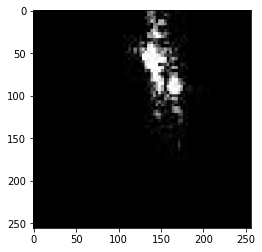

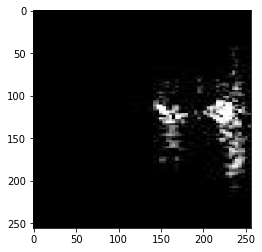

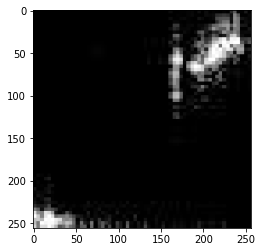

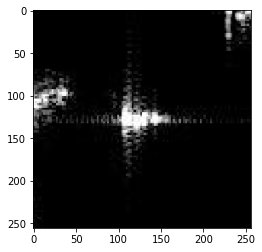

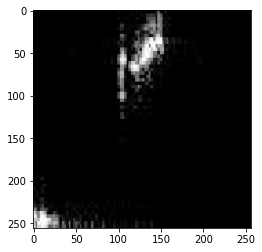

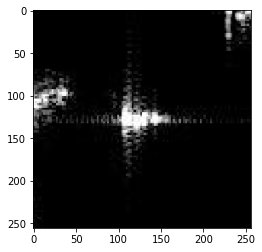

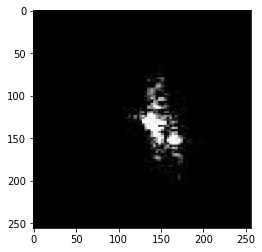

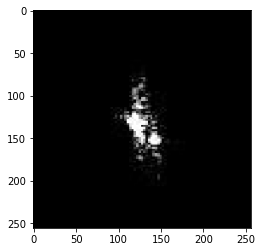

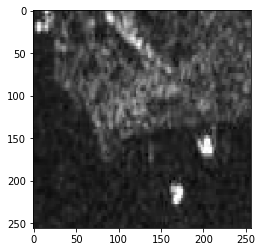

<BarContainer object of 4 artists>

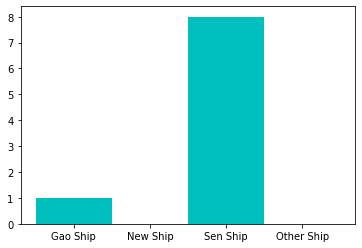

In [71]:
files = glob.glob(evaluation_folder_output+'/*')
results = {
    "Gao Ship": 0,
    "New Ship": 0,
    "Sen Ship": 0,
    "Other Ship": 0,
}

for path in files:
  img = Image.open(path)
  plt.imshow(img)
  plt.show()
  transform = transforms.ToTensor()
  # Convert the image to PyTorch tensor
  tensor = transform(img)
  full_breed_name, probability = predict_ship_transfer(tensor)
  #print(probability)
  #print(full_breed_name[0])
  if full_breed_name[0] == "001.Gao":
    results['Gao Ship'] += 1
  elif full_breed_name[0] == "002.Newship":
    results['New Ship'] += 1  
  elif full_breed_name[0] == "003.Sen":
    results['Sen Ship'] += 1
  elif full_breed_name[0] == "002.Ship":
    results['Other Ship'] += 1    

plt.bar(results.keys(), results.values(), width=1, color='c')

---
<a id='step5'></a>
## Step 2: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

In [ ]:
### DONE: Write your algorithm.
### Feel free to use as many code cells as needed.
## handle cases for a human face, dog, and neither
import random
import matplotlib.pyplot as plt                        

human_files = np.array(glob("/data/lfw/*/*"))
dog_files = np.array(glob("/data/dog_images/*/*/*"))

def show_image(img_path):
    img = Image.open(img_path)
    plt.imshow(img)
    plt.show()

def show_breed(label):
    subdir = ''.join(['/data/dog_images/valid/', label + '/'])
    file = random.choice(os.listdir(subdir))
    path = ''.join([subdir, file])
    img = Image.open(path)
    plt.imshow(img)
    plt.show()

def run_app(img_path):
    breed_name, full_breed_name, probability = predict_breed_transfer(img_path)
    
    if probability[0] > 0.3:
        print("A dog is detected ...")
        show_image(img_path)
        print("The predicted breeds is {0}, with an associated probability of %{1:.2f}:\n".format(breed_name[0], probability[0]*100))     
        show_breed(full_breed_name[0])
    
    elif face_detector(img_path):
        print("Hello, human!")
        show_image(img_path)
        print("You look like a  ... \n")
        print("{0}, with an associated probability of %{1:.2f}:\n".format(breed_name[0], probability[0]*100))     
        show_breed(full_breed_name[0])
    else:
        print("Oh no! Neither a human nor a dog was detected!\n")
        show_image(img_path)

---
<a id='step6'></a>


In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ (Three possible points for improvement)

Three possible improvements can be proposed as:
 
i) Using sub-plots to show top 3 (or 5) breed probabilities for better demonstration of the breeed detection.

ii) Reducing code repetition cases and including them intoe functions, wehere possible

iii) Handling multiple dogs and/or human in a single image

iv) Generalizing the output 

Hello, human!


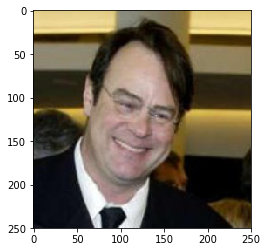

You look like a  ... 

Dogue de bordeaux, with an associated probability of %1.87:



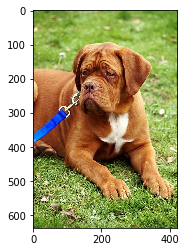

Hello, human!


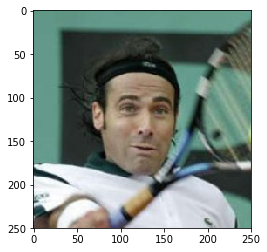

You look like a  ... 

Bearded collie, with an associated probability of %2.45:



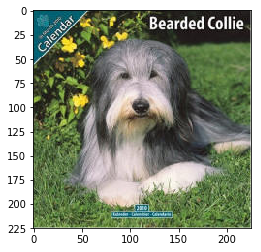

Hello, human!


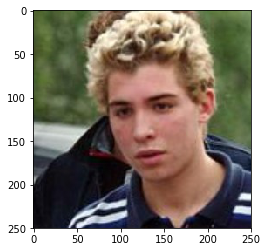

You look like a  ... 

Wirehaired pointing griffon, with an associated probability of %2.06:



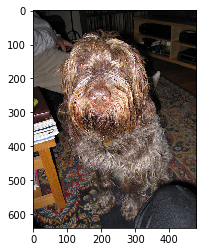

Hello, human!


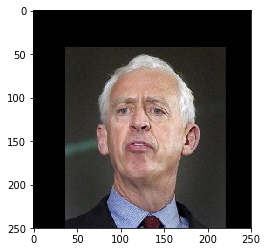

You look like a  ... 

Wirehaired pointing griffon, with an associated probability of %2.59:



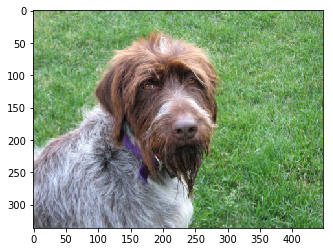

Hello, human!


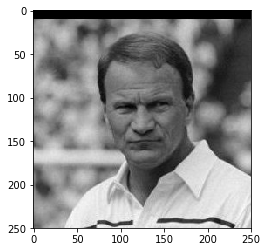

You look like a  ... 

Wirehaired pointing griffon, with an associated probability of %1.78:



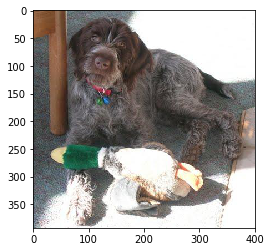

Hello, human!


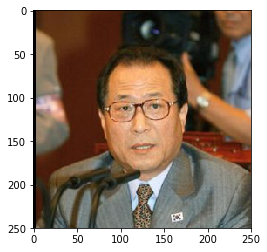

You look like a  ... 

Field spaniel, with an associated probability of %1.74:



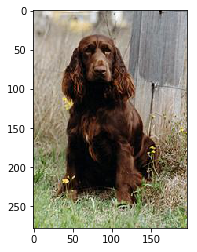

A dog is detected ...


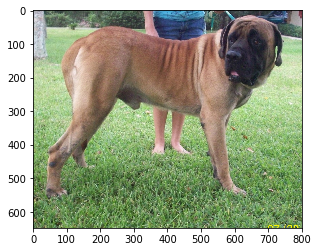

The predicted breeds is Bullmastiff, with an associated probability of %50.58:



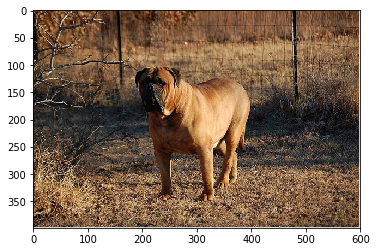

A dog is detected ...


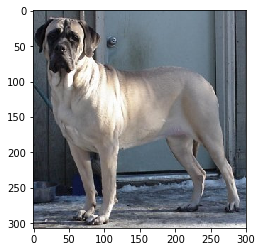

The predicted breeds is Mastiff, with an associated probability of %34.17:



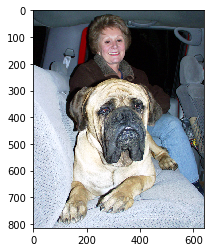

A dog is detected ...


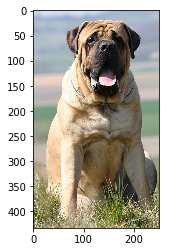

The predicted breeds is Bullmastiff, with an associated probability of %39.82:



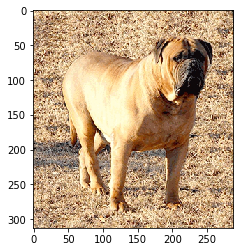

A dog is detected ...


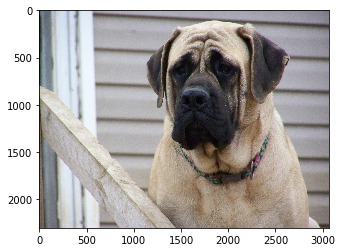

The predicted breeds is Bullmastiff, with an associated probability of %52.15:



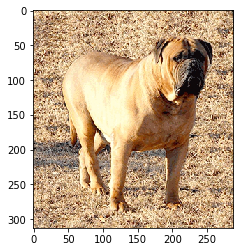

A dog is detected ...


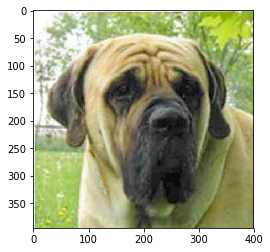

The predicted breeds is Mastiff, with an associated probability of %46.21:



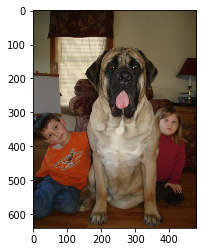

A dog is detected ...


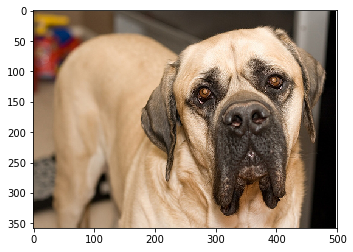

The predicted breeds is Mastiff, with an associated probability of %74.18:



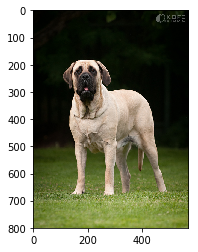

In [ ]:
## DONE: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

## suggested code, below
for file in np.hstack((human_files[:6], dog_files[:6])):
    run_app(file)